In [2]:
# подключим свой аккаунт ClearML
%env CLEARML_WEB_HOST=https://app.clear.ml
%env CLEARML_API_HOST=https://api.clear.ml
%env CLEARML_FILES_HOST=https://files.clear.ml
%env CLEARML_API_ACCESS_KEY=%%%%%%%%%%%%%%%%%%%%%
%env CLEARML_API_SECRET_KEY=%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

# Тренировка FasterRCNN

In [1]:
from mmdet.models.detectors.faster_rcnn import TwoStageDetector
from mmdet.utils import ConfigType, OptConfigType, OptMultiConfig
from mmdet.registry import MODELS
from typing import Dict,  Union
import torch
from mmengine.runner import Runner
from mmengine.config import Config
from mmengine.registry import HOOKS
from mmengine.hooks import Hook
from mmengine.optim import OptimWrapper
from mmdet.apis import init_detector, inference_detector
from mmdet.registry import VISUALIZERS
from mmengine.structures import InstanceData
import mmcv
from torchmetrics.detection.mean_ap import MeanAveragePrecision
import json
import os

In [2]:
# функция для преобразования координат ограничивающих рамок
def xywh_to_xyxy(box):
    x0, y0, w, h = box
    return (x0, y0, x0 + w, y0 + h)

In [3]:
# Сделаем хук для сбора лоссов с тренировочной и валидационной выборок
@HOOKS.register_module()
class CollectMetricsHook_fasterRCNN(Hook):


    def after_train_epoch(self, runner) -> None:
        
        iters = runner.train_loop.max_iters / runner.train_loop.max_epochs
        full_loss = runner.model.full_loss / iters
        loss_bbox = runner.model.loss_bbox / iters
        loss_cls = runner.model.loss_cls / iters
        loss_rpn_bbox = runner.model.loss_rpn_bbox / iters
        loss_rpn_cls = runner.model.loss_rpn_cls / iters
        
        runner.message_hub.update_scalar('val/train/loss', full_loss)
        runner.message_hub.update_scalar('val/train/loss_rpn_cls', loss_rpn_cls)
        runner.message_hub.update_scalar('val/train/loss_rpn_bbox', loss_rpn_bbox)
        runner.message_hub.update_scalar('val/train/loss_cls', loss_cls)
        runner.message_hub.update_scalar('val/train/loss_bbox', loss_bbox)
        
        runner.model.full_loss = 0
        runner.model.loss_bbox = 0
        runner.model.loss_cls = 0
        runner.model.loss_rpn_bbox = 0
        runner.model.loss_rpn_cls = 0
        


    def after_val_iter(self, runner, batch_idx, data_batch=None, outputs=None):
        
        with runner.optim_wrapper.optim_context(self):
            data = runner.model.data_preprocessor(data_batch, True)
            losses = runner.model._run_forward(data, mode='loss')
            _, log_vars = runner.model.parse_losses(losses)

        runner.message_hub.update_scalar('val/val/loss', log_vars['loss'].cpu().item())
        runner.message_hub.update_scalar('val/val/loss_rpn_cls', log_vars['loss_rpn_cls'].cpu().item())
        runner.message_hub.update_scalar('val/val/loss_rpn_bbox', log_vars['loss_rpn_bbox'].cpu().item())
        runner.message_hub.update_scalar('val/val/loss_cls', log_vars['loss_cls'].cpu().item())
        runner.message_hub.update_scalar('val/val/acc', log_vars['acc'].cpu().item())
        runner.message_hub.update_scalar('val/val/loss_bbox', log_vars['loss_bbox'].cpu().item())


In [4]:
# Модифицируем модель для сбора метрик
@MODELS.register_module()
class FasterRCNN_custom(TwoStageDetector):
    """Implementation of `Faster R-CNN <https://arxiv.org/abs/1506.01497>`_"""

    def __init__(self,
                 backbone: ConfigType,
                 rpn_head: ConfigType,
                 roi_head: ConfigType,
                 train_cfg: ConfigType,
                 test_cfg: ConfigType,
                 neck: OptConfigType = None,
                 data_preprocessor: OptConfigType = None,
                 init_cfg: OptMultiConfig = None) -> None:
        super().__init__(
            backbone=backbone,
            neck=neck,
            rpn_head=rpn_head,
            roi_head=roi_head,
            train_cfg=train_cfg,
            test_cfg=test_cfg,
            init_cfg=init_cfg,
            data_preprocessor=data_preprocessor)
        
        self.full_loss = 0
        self.loss_bbox = 0
        self.loss_cls = 0
        self.loss_rpn_bbox = 0
        self.loss_rpn_cls = 0
        
    
    def train_step(self, data: Union[dict, tuple, list],
                    optim_wrapper: OptimWrapper) -> Dict[str, torch.Tensor]:
        """Implements the default model training process including
        preprocessing, model forward propagation, loss calculation,
        optimization, and back-propagation.

        During non-distributed training. If subclasses do not override the
        :meth:`train_step`, :class:`EpochBasedTrainLoop` or
        :class:`IterBasedTrainLoop` will call this method to update model
        parameters. The default parameter update process is as follows:

        1. Calls ``self.data_processor(data, training=False)`` to collect
            batch_inputs and corresponding data_samples(labels).
        2. Calls ``self(batch_inputs, data_samples, mode='loss')`` to get raw
            loss
        3. Calls ``self.parse_losses`` to get ``parsed_losses`` tensor used to
            backward and dict of loss tensor used to log messages.
        4. Calls ``optim_wrapper.update_params(loss)`` to update model.

        Args:
            data (dict or tuple or list): Data sampled from dataset.
            optim_wrapper (OptimWrapper): OptimWrapper instance
                used to update model parameters.

        Returns:
            Dict[str, torch.Tensor]: A ``dict`` of tensor for logging.
        """
        # Enable automatic mixed precision training context.
        with optim_wrapper.optim_context(self):
            data = self.data_preprocessor(data, True)
            losses = self._run_forward(data, mode='loss')  # type: ignore
        parsed_losses, log_vars = self.parse_losses(losses)  # type: ignore
        optim_wrapper.update_params(parsed_losses)
        
        self.full_loss += log_vars['loss'].item()
        self.loss_bbox += log_vars['loss_bbox'].item()
        self.loss_cls += log_vars['loss_cls'].item()
        self.loss_rpn_bbox += log_vars['loss_rpn_bbox'].item()
        self.loss_rpn_cls += log_vars['loss_rpn_cls'].item()
        
        return log_vars

In [5]:
# Загрузим конфигурационный файл предобученной модели fasterRCNN среднего размера
# для экономии ресурсов, предоставляемый библиотекой mmdetection
cfg = Config.fromfile('./configs/faster_rcnn/faster-rcnn_r50_fpn_mstrain_3x_coco.py')

In [6]:
# Преобразуем конфигурационный файл под нашу задачу
cfg.work_dir = 'work_dirs/fasterRCNN_custom/not_frozen' # папка для хранения результатов

 # подключим ClaerML для визуализации
cfg.visualizer=dict(
    type='DetLocalVisualizer', 
    name='visualiser', 
    vis_backends=[dict(type='ClearMLVisBackend')])

# поключим наш хук для сбора лоссов
cfg.custom_hooks = [dict(type='CollectMetricsHook_fasterRCNN')]

# подключим нашу модифицированную модель
cfg.model.type = 'FasterRCNN_custom'

# загрузим веса нашей предобученной модели
cfg.load_from = 'checkpoints/faster_rcnn_r50_fpn_mstrain_3x_coco_20210524_110822-e10bd31c.pth'

# установим интервал для валидации
cfg.default_hooks.checkpoint.interval = 1

# установим настройки для хранения чекпоинтов и лучшей подели по метрикам
cfg.default_hooks.checkpoint = dict(
        type='CheckpointHook',
        interval=1,
        max_keep_ckpts=50,
        save_last=True,
        save_best='coco/bbox_mAP'
    )

# пропишем путь хранения датасета
data_root = 'data/masks_coco/'

# пропишем информацию о классах
metainfo = dict(                  
    classes=(
        'mask_weared_incorrect', 
        'without_mask', 
        'with_mask'
    ),
    palette=[
        (
            220,
            20,
            60,
        ),
        (
            119,
            11,
            32,
        ),
        (
            0,
            0,
            142,
        )
    ])        

# пропишем настройки тренировочного загрузчика
cfg.train_dataloader.batch_size = 2
cfg.train_dataloader.num_workers = 2
cfg.train_dataloader.dataset.dataset.data_root = data_root
cfg.train_dataloader.dataset.dataset.metainfo = metainfo
cfg.train_dataloader.dataset.dataset.ann_file = 'train.json'
cfg.train_dataloader.dataset.dataset.data_prefix = dict(img='train/')

# пропишем настройки валидационного загрузчика
cfg.val_dataloader.batch_size = 2
cfg.val_dataloader.num_workers = 2
cfg.val_dataloader.dataset.data_root = data_root
cfg.val_dataloader.dataset.metainfo = metainfo
cfg.val_dataloader.dataset.ann_file = 'val.json'
cfg.val_dataloader.dataset.data_prefix = dict(img='val/')

# пропишем настройки тестового загрузчика
cfg.test_dataloader.batch_size = 2
cfg.test_dataloader.num_workers = 2
cfg.test_dataloader.dataset.data_root = data_root
cfg.test_dataloader.dataset.metainfo = metainfo
cfg.test_dataloader.dataset.ann_file = 'val.json'
cfg.test_dataloader.dataset.data_prefix = dict(img='val/')

# пропишем настройки валидаторов
cfg.val_evaluator.ann_file = data_root + 'val.json'
cfg.test_evaluator.ann_file = data_root + 'val.json'

# заморозка слоев не дала результатов
# cfg.model.backbone.frozen_stages = 4

# укажем наше количество классов
cfg.model.roi_head.bbox_head.num_classes = 3

# лучший шаг обучения
cfg.optim_wrapper.optimizer.lr = 0.02

In [7]:
# сформируем раннер обучения
runner = Runner.from_cfg(cfg)

01/06 06:32:45 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.18 (default, Sep 11 2023, 13:40:15) [GCC 11.2.0]
    CUDA available: True
    numpy_random_seed: 1530274565
    GPU 0,1: Quadro RTX 4000
    CUDA_HOME: None
    GCC: gcc (Ubuntu 12.3.0-1ubuntu1~23.04) 12.3.0
    PyTorch: 2.0.1+cu117
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.7
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_70,

Could not read Jupyter Notebook: No module named 'nbconvert'


ClearML Task: created new task id=2c7a64f511454d57a294f7e98b5eb809
ClearML results page: https://app.clear.ml/projects/f31d45a2a35249b2b62685c6b95d68ab/experiments/2c7a64f511454d57a294f7e98b5eb809/output/log
01/06 06:32:58 - mmengine - INFO - Distributed training is not used, all SyncBatchNorm (SyncBN) layers in the model will be automatically reverted to BatchNormXd layers if they are used.
01/06 06:32:58 - mmengine - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) RuntimeInfoHook                    
(BELOW_NORMAL) LoggerHook                         
 -------------------- 
before_train:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
(VERY_LOW    ) CheckpointHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
(NORMAL      ) DistSamplerSeedHook                
 -------------------- 


In [10]:
# обучим модель
runner.train()

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
01/06 06:33:00 - mmengine - INFO - load model from: torchvision://resnet50
01/06 06:33:00 - mmengine - INFO - Loads checkpoint by torchvision backend from path: torchvision://resnet50
01/06 06:33:04 - mmengine - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: fc.weight, fc.bias

Loads checkpoint by local backend from path: checkpoints/faster_rcnn_r50_fpn_mstrain_3x_coco_20210524_110822-e10bd31c.pth
The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([4, 1024]).
size mismatch for roi_head.bbox_head.fc_cls.bias: copying a param with

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 06:37:46 - mmengine - INFO - Epoch(train)   [1][ 750/1023]  lr: 2.0000e-02  eta: 2 days, 4:28:10  time: 0.3588  data_time: 0.0031  memory: 0  loss: 0.4073  loss_rpn_cls: 0.0252  loss_rpn_bbox: 0.0334  loss_cls: 0.1388  acc: 95.6055  loss_bbox: 0.2099
01/06 06:38:05 - mmengine - INFO - Epoch(train)   [1][ 800/1023]  lr: 2.0000e-02  eta: 2 days, 4:27:39  time: 0.3694  data_time: 0.0033  memory: 0  loss: 0.3794  loss_rpn_cls: 0.0235  loss_rpn_bbox: 0.0207  loss_cls: 0.1188  acc: 98.6328  loss_bbox: 0.2165
01/06 06:38:24 - mmengine - INFO - Epoch(train)   [1][ 850/1023]  lr: 2.0000e-02  eta: 2 days, 4:35:41  time: 0.3865  data_time: 0.0042  memory: 0  loss: 0.3237  loss_rpn_cls: 0.0133  loss_rpn_bbox: 0.0193  loss_cls: 0.1017  acc: 99.2188  loss_bbox: 0.1893
01/06 06:38:42 - mmengine - INFO - Epoch(train)   [1][ 900/1023]  lr: 2.0000e-02  eta: 2 days, 4:32:36  time: 0.3649  data_time: 0.0052  memory: 0  loss: 0.3439  loss_rpn_cls: 0.0099  loss_rpn_bbox: 0.0160  loss_cls: 0.1181  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 06:39:01 - mmengine - INFO - Epoch(train)   [1][ 950/1023]  lr: 2.0000e-02  eta: 2 days, 4:30:39  time: 0.3668  data_time: 0.0031  memory: 0  loss: 0.3424  loss_rpn_cls: 0.0086  loss_rpn_bbox: 0.0148  loss_cls: 0.1273  acc: 93.7500  loss_bbox: 0.1917
01/06 06:39:20 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 06:39:20 - mmengine - INFO - Epoch(train)   [1][1000/1023]  lr: 2.0000e-02  eta: 2 days, 4:38:08  time: 0.3886  data_time: 0.0044  memory: 0  loss: 0.3550  loss_rpn_cls: 0.0092  loss_rpn_bbox: 0.0193  loss_cls: 0.1168  acc: 97.8516  loss_bbox: 0.2096
01/06 06:39:28 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 06:39:28 - mmengine - INFO - Saving checkpoint at 1 epochs
01/06 06:39:49 - mmengine - INFO - Epoch(val)   [1][50/86]    eta: 0:00:14  time: 0.3947  data_time: 0.2043  memory: 0  val/loss: 1.2852  val/loss_rpn_cls: 0.7499  val/loss_rpn_bbox: 0.0572  val/loss_cls: 0.4517  val/loss_bbox:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 06:41:40 - mmengine - INFO - Epoch(train)   [2][ 250/1023]  lr: 2.0000e-02  eta: 2 days, 4:29:09  time: 0.3646  data_time: 0.0054  memory: 0  loss: 0.3532  loss_rpn_cls: 0.0093  loss_rpn_bbox: 0.0229  loss_cls: 0.1169  acc: 93.9453  loss_bbox: 0.2041
01/06 06:41:58 - mmengine - INFO - Epoch(train)   [2][ 300/1023]  lr: 2.0000e-02  eta: 2 days, 4:28:45  time: 0.3700  data_time: 0.0031  memory: 0  loss: 0.3235  loss_rpn_cls: 0.0090  loss_rpn_bbox: 0.0223  loss_cls: 0.1030  acc: 98.7305  loss_bbox: 0.1891
01/06 06:42:17 - mmengine - INFO - Epoch(train)   [2][ 350/1023]  lr: 2.0000e-02  eta: 2 days, 4:31:07  time: 0.3790  data_time: 0.0040  memory: 0  loss: 0.3619  loss_rpn_cls: 0.0148  loss_rpn_bbox: 0.0198  loss_cls: 0.1306  acc: 90.9180  loss_bbox: 0.1967


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 06:42:35 - mmengine - INFO - Epoch(train)   [2][ 400/1023]  lr: 2.0000e-02  eta: 2 days, 4:29:45  time: 0.3671  data_time: 0.0031  memory: 0  loss: 0.3692  loss_rpn_cls: 0.0155  loss_rpn_bbox: 0.0218  loss_cls: 0.1284  acc: 93.0664  loss_bbox: 0.2036
01/06 06:42:53 - mmengine - INFO - Epoch(train)   [2][ 450/1023]  lr: 2.0000e-02  eta: 2 days, 4:25:42  time: 0.3575  data_time: 0.0030  memory: 0  loss: 0.3537  loss_rpn_cls: 0.0145  loss_rpn_bbox: 0.0180  loss_cls: 0.1219  acc: 96.2891  loss_bbox: 0.1993
01/06 06:43:12 - mmengine - INFO - Epoch(train)   [2][ 500/1023]  lr: 2.0000e-02  eta: 2 days, 4:28:31  time: 0.3813  data_time: 0.0037  memory: 0  loss: 0.3349  loss_rpn_cls: 0.0096  loss_rpn_bbox: 0.0180  loss_cls: 0.1161  acc: 99.1211  loss_bbox: 0.1912
01/06 06:43:31 - mmengine - INFO - Epoch(train)   [2][ 550/1023]  lr: 2.0000e-02  eta: 2 days, 4:29:26  time: 0.3749  data_time: 0.0031  memory: 0  loss: 0.3187  loss_rpn_cls: 0.0076  loss_rpn_bbox: 0.0163  loss_cls: 0.1089  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 06:46:10 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 06:46:18 - mmengine - INFO - Epoch(train)   [2][1000/1023]  lr: 2.0000e-02  eta: 2 days, 4:28:42  time: 0.3773  data_time: 0.0038  memory: 0  loss: 0.2731  loss_rpn_cls: 0.0067  loss_rpn_bbox: 0.0149  loss_cls: 0.0860  acc: 93.7500  loss_bbox: 0.1656
01/06 06:46:27 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 06:46:27 - mmengine - INFO - Saving checkpoint at 2 epochs
01/06 06:46:48 - mmengine - INFO - Epoch(val)   [2][50/86]    eta: 0:00:14  time: 0.3899  data_time: 0.2007  memory: 0  val/loss: 1.3196  val/loss_rpn_cls: 0.7747  val/loss_rpn_bbox: 0.0529  val/loss_cls: 0.4656  val/loss_bbox: 0.0263
01/06 06:47:01 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.34s).
Accumulating evaluation results...

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 06:48:00 - mmengine - INFO - Epoch(train)   [3][ 150/1023]  lr: 2.0000e-02  eta: 2 days, 4:27:33  time: 0.3660  data_time: 0.0032  memory: 0  loss: 0.2882  loss_rpn_cls: 0.0053  loss_rpn_bbox: 0.0174  loss_cls: 0.0900  acc: 99.6094  loss_bbox: 0.1754


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 06:48:19 - mmengine - INFO - Epoch(train)   [3][ 200/1023]  lr: 2.0000e-02  eta: 2 days, 4:30:20  time: 0.3871  data_time: 0.0041  memory: 0  loss: 0.2698  loss_rpn_cls: 0.0070  loss_rpn_bbox: 0.0138  loss_cls: 0.0918  acc: 90.5273  loss_bbox: 0.1571
01/06 06:48:38 - mmengine - INFO - Epoch(train)   [3][ 250/1023]  lr: 2.0000e-02  eta: 2 days, 4:28:55  time: 0.3653  data_time: 0.0031  memory: 0  loss: 0.3322  loss_rpn_cls: 0.0049  loss_rpn_bbox: 0.0171  loss_cls: 0.1072  acc: 98.9258  loss_bbox: 0.2029
01/06 06:48:56 - mmengine - INFO - Epoch(train)   [3][ 300/1023]  lr: 2.0000e-02  eta: 2 days, 4:27:05  time: 0.3626  data_time: 0.0031  memory: 0  loss: 0.3098  loss_rpn_cls: 0.0075  loss_rpn_bbox: 0.0172  loss_cls: 0.1029  acc: 90.0391  loss_bbox: 0.1821
01/06 06:49:15 - mmengine - INFO - Epoch(train)   [3][ 350/1023]  lr: 2.0000e-02  eta: 2 days, 4:28:19  time: 0.3796  data_time: 0.0039  memory: 0  loss: 0.3366  loss_rpn_cls: 0.0089  loss_rpn_bbox: 0.0199  loss_cls: 0.1157  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 06:50:47 - mmengine - INFO - Epoch(train)   [3][ 600/1023]  lr: 2.0000e-02  eta: 2 days, 4:23:17  time: 0.3607  data_time: 0.0031  memory: 0  loss: 0.2850  loss_rpn_cls: 0.0074  loss_rpn_bbox: 0.0134  loss_cls: 0.0992  acc: 99.2188  loss_bbox: 0.1650
01/06 06:51:05 - mmengine - INFO - Epoch(train)   [3][ 650/1023]  lr: 2.0000e-02  eta: 2 days, 4:23:56  time: 0.3767  data_time: 0.0034  memory: 0  loss: 0.2895  loss_rpn_cls: 0.0055  loss_rpn_bbox: 0.0171  loss_cls: 0.0993  acc: 94.1406  loss_bbox: 0.1676
01/06 06:51:24 - mmengine - INFO - Epoch(train)   [3][ 700/1023]  lr: 2.0000e-02  eta: 2 days, 4:25:27  time: 0.3826  data_time: 0.0036  memory: 0  loss: 0.3355  loss_rpn_cls: 0.0123  loss_rpn_bbox: 0.0175  loss_cls: 0.1148  acc: 99.0234  loss_bbox: 0.1909
01/06 06:51:43 - mmengine - INFO - Epoch(train)   [3][ 750/1023]  lr: 2.0000e-02  eta: 2 days, 4:23:56  time: 0.3630  data_time: 0.0030  memory: 0  loss: 0.2848  loss_rpn_cls: 0.0107  loss_rpn_bbox: 0.0158  loss_cls: 0.0923  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 06:56:49 - mmengine - INFO - Epoch(train)   [4][ 450/1023]  lr: 2.0000e-02  eta: 2 days, 4:22:37  time: 0.3716  data_time: 0.0031  memory: 0  loss: 0.2935  loss_rpn_cls: 0.0049  loss_rpn_bbox: 0.0173  loss_cls: 0.0885  acc: 97.0703  loss_bbox: 0.1829
01/06 06:57:08 - mmengine - INFO - Epoch(train)   [4][ 500/1023]  lr: 2.0000e-02  eta: 2 days, 4:23:12  time: 0.3787  data_time: 0.0035  memory: 0  loss: 0.2548  loss_rpn_cls: 0.0019  loss_rpn_bbox: 0.0135  loss_cls: 0.0782  acc: 94.9219  loss_bbox: 0.1611
01/06 06:57:27 - mmengine - INFO - Epoch(train)   [4][ 550/1023]  lr: 2.0000e-02  eta: 2 days, 4:23:08  time: 0.3733  data_time: 0.0036  memory: 0  loss: 0.2716  loss_rpn_cls: 0.0050  loss_rpn_bbox: 0.0156  loss_cls: 0.0809  acc: 94.9219  loss_bbox: 0.1701
01/06 06:57:45 - mmengine - INFO - Epoch(train)   [4][ 600/1023]  lr: 2.0000e-02  eta: 2 days, 4:23:05  time: 0.3736  data_time: 0.0052  memory: 0  loss: 0.2957  loss_rpn_cls: 0.0052  loss_rpn_bbox: 0.0176  loss_cls: 0.0921  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 06:59:56 - mmengine - INFO - Epoch(train)   [4][ 950/1023]  lr: 2.0000e-02  eta: 2 days, 4:22:28  time: 0.3638  data_time: 0.0032  memory: 0  loss: 0.2011  loss_rpn_cls: 0.0017  loss_rpn_bbox: 0.0092  loss_cls: 0.0650  acc: 98.7305  loss_bbox: 0.1251
01/06 07:00:15 - mmengine - INFO - Epoch(train)   [4][1000/1023]  lr: 2.0000e-02  eta: 2 days, 4:23:49  time: 0.3874  data_time: 0.0065  memory: 0  loss: 0.2699  loss_rpn_cls: 0.0060  loss_rpn_bbox: 0.0181  loss_cls: 0.0844  acc: 96.9727  loss_bbox: 0.1614
01/06 07:00:24 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 07:00:24 - mmengine - INFO - Saving checkpoint at 4 epochs
01/06 07:00:45 - mmengine - INFO - Epoch(val)   [4][50/86]    eta: 0:00:14  time: 0.3925  data_time: 0.2032  memory: 0  val/loss: 1.3236  val/loss_rpn_cls: 0.7831  val/loss_rpn_bbox: 0.0554  val/loss_cls: 0.4597  val/loss_bbox: 0.0254
01/06 07:00:59 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DO

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:03:10 - mmengine - INFO - Epoch(train)   [5][ 350/1023]  lr: 2.0000e-02  eta: 2 days, 4:23:04  time: 0.3715  data_time: 0.0061  memory: 0  loss: 0.2365  loss_rpn_cls: 0.0034  loss_rpn_bbox: 0.0134  loss_cls: 0.0659  acc: 98.7305  loss_bbox: 0.1538
01/06 07:03:29 - mmengine - INFO - Epoch(train)   [5][ 400/1023]  lr: 2.0000e-02  eta: 2 days, 4:22:47  time: 0.3723  data_time: 0.0038  memory: 0  loss: 0.2190  loss_rpn_cls: 0.0038  loss_rpn_bbox: 0.0124  loss_cls: 0.0612  acc: 97.6562  loss_bbox: 0.1416
01/06 07:03:47 - mmengine - INFO - Epoch(train)   [5][ 450/1023]  lr: 2.0000e-02  eta: 2 days, 4:22:30  time: 0.3721  data_time: 0.0032  memory: 0  loss: 0.2691  loss_rpn_cls: 0.0033  loss_rpn_bbox: 0.0185  loss_cls: 0.0781  acc: 96.7773  loss_bbox: 0.1692


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:04:05 - mmengine - INFO - Epoch(train)   [5][ 500/1023]  lr: 2.0000e-02  eta: 2 days, 4:20:52  time: 0.3576  data_time: 0.0034  memory: 0  loss: 0.2523  loss_rpn_cls: 0.0038  loss_rpn_bbox: 0.0161  loss_cls: 0.0743  acc: 98.4375  loss_bbox: 0.1581
01/06 07:04:24 - mmengine - INFO - Epoch(train)   [5][ 550/1023]  lr: 2.0000e-02  eta: 2 days, 4:21:31  time: 0.3823  data_time: 0.0041  memory: 0  loss: 0.2547  loss_rpn_cls: 0.0060  loss_rpn_bbox: 0.0140  loss_cls: 0.0773  acc: 96.7773  loss_bbox: 0.1574
01/06 07:04:42 - mmengine - INFO - Epoch(train)   [5][ 600/1023]  lr: 2.0000e-02  eta: 2 days, 4:20:07  time: 0.3597  data_time: 0.0031  memory: 0  loss: 0.2313  loss_rpn_cls: 0.0046  loss_rpn_bbox: 0.0128  loss_cls: 0.0701  acc: 99.4141  loss_bbox: 0.1439


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:05:00 - mmengine - INFO - Epoch(train)   [5][ 650/1023]  lr: 2.0000e-02  eta: 2 days, 4:18:19  time: 0.3549  data_time: 0.0031  memory: 0  loss: 0.2432  loss_rpn_cls: 0.0021  loss_rpn_bbox: 0.0132  loss_cls: 0.0701  acc: 92.5781  loss_bbox: 0.1579
01/06 07:05:20 - mmengine - INFO - Epoch(train)   [5][ 700/1023]  lr: 2.0000e-02  eta: 2 days, 4:19:40  time: 0.3905  data_time: 0.0040  memory: 0  loss: 0.2417  loss_rpn_cls: 0.0029  loss_rpn_bbox: 0.0127  loss_cls: 0.0695  acc: 99.0234  loss_bbox: 0.1566
01/06 07:05:38 - mmengine - INFO - Epoch(train)   [5][ 750/1023]  lr: 2.0000e-02  eta: 2 days, 4:19:15  time: 0.3705  data_time: 0.0052  memory: 0  loss: 0.2898  loss_rpn_cls: 0.0050  loss_rpn_bbox: 0.0183  loss_cls: 0.0845  acc: 93.4570  loss_bbox: 0.1819
01/06 07:05:56 - mmengine - INFO - Epoch(train)   [5][ 800/1023]  lr: 2.0000e-02  eta: 2 days, 4:18:31  time: 0.3668  data_time: 0.0030  memory: 0  loss: 0.2759  loss_rpn_cls: 0.0036  loss_rpn_bbox: 0.0217  loss_cls: 0.0767  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:11:24 - mmengine - INFO - Epoch(train)   [6][ 550/1023]  lr: 2.0000e-02  eta: 2 days, 4:18:42  time: 0.3843  data_time: 0.0041  memory: 0  loss: 0.2458  loss_rpn_cls: 0.0044  loss_rpn_bbox: 0.0197  loss_cls: 0.0726  acc: 93.6523  loss_bbox: 0.1491
01/06 07:11:42 - mmengine - INFO - Epoch(train)   [6][ 600/1023]  lr: 2.0000e-02  eta: 2 days, 4:17:12  time: 0.3562  data_time: 0.0033  memory: 0  loss: 0.2420  loss_rpn_cls: 0.0042  loss_rpn_bbox: 0.0138  loss_cls: 0.0772  acc: 98.6328  loss_bbox: 0.1468
01/06 07:12:00 - mmengine - INFO - Epoch(train)   [6][ 650/1023]  lr: 2.0000e-02  eta: 2 days, 4:16:30  time: 0.3667  data_time: 0.0033  memory: 0  loss: 0.2337  loss_rpn_cls: 0.0028  loss_rpn_bbox: 0.0114  loss_cls: 0.0710  acc: 95.8984  loss_bbox: 0.1485


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:12:19 - mmengine - INFO - Epoch(train)   [6][ 700/1023]  lr: 2.0000e-02  eta: 2 days, 4:17:09  time: 0.3855  data_time: 0.0037  memory: 0  loss: 0.2277  loss_rpn_cls: 0.0035  loss_rpn_bbox: 0.0149  loss_cls: 0.0602  acc: 96.6797  loss_bbox: 0.1492
01/06 07:12:38 - mmengine - INFO - Epoch(train)   [6][ 750/1023]  lr: 2.0000e-02  eta: 2 days, 4:16:28  time: 0.3670  data_time: 0.0031  memory: 0  loss: 0.2391  loss_rpn_cls: 0.0038  loss_rpn_bbox: 0.0145  loss_cls: 0.0683  acc: 97.9492  loss_bbox: 0.1525
01/06 07:12:56 - mmengine - INFO - Epoch(train)   [6][ 800/1023]  lr: 2.0000e-02  eta: 2 days, 4:15:22  time: 0.3610  data_time: 0.0031  memory: 0  loss: 0.2259  loss_rpn_cls: 0.0025  loss_rpn_bbox: 0.0131  loss_cls: 0.0618  acc: 99.5117  loss_bbox: 0.1486
01/06 07:13:15 - mmengine - INFO - Epoch(train)   [6][ 850/1023]  lr: 2.0000e-02  eta: 2 days, 4:16:08  time: 0.3873  data_time: 0.0039  memory: 0  loss: 0.2446  loss_rpn_cls: 0.0028  loss_rpn_bbox: 0.0141  loss_cls: 0.0686  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:13:51 - mmengine - INFO - Epoch(train)   [6][ 950/1023]  lr: 2.0000e-02  eta: 2 days, 4:14:11  time: 0.3635  data_time: 0.0055  memory: 0  loss: 0.2242  loss_rpn_cls: 0.0023  loss_rpn_bbox: 0.0133  loss_cls: 0.0642  acc: 98.9258  loss_bbox: 0.1445
01/06 07:14:11 - mmengine - INFO - Epoch(train)   [6][1000/1023]  lr: 2.0000e-02  eta: 2 days, 4:15:01  time: 0.3885  data_time: 0.0040  memory: 0  loss: 0.2265  loss_rpn_cls: 0.0020  loss_rpn_bbox: 0.0134  loss_cls: 0.0657  acc: 94.8242  loss_bbox: 0.1455
01/06 07:14:20 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 07:14:20 - mmengine - INFO - Saving checkpoint at 6 epochs
01/06 07:14:41 - mmengine - INFO - Epoch(val)   [6][50/86]    eta: 0:00:14  time: 0.3926  data_time: 0.2025  memory: 0  val/loss: 1.4553  val/loss_rpn_cls: 0.8732  val/loss_rpn_bbox: 0.0453  val/loss_cls: 0.5107  val/loss_bbox: 0.0261
01/06 07:14:54 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DO

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:17:05 - mmengine - INFO - Epoch(train)   [7][ 350/1023]  lr: 2.0000e-02  eta: 2 days, 4:13:45  time: 0.3772  data_time: 0.0033  memory: 0  loss: 0.2113  loss_rpn_cls: 0.0026  loss_rpn_bbox: 0.0124  loss_cls: 0.0591  acc: 98.0469  loss_bbox: 0.1372
01/06 07:17:24 - mmengine - INFO - Epoch(train)   [7][ 400/1023]  lr: 2.0000e-02  eta: 2 days, 4:14:04  time: 0.3821  data_time: 0.0040  memory: 0  loss: 0.2148  loss_rpn_cls: 0.0017  loss_rpn_bbox: 0.0125  loss_cls: 0.0622  acc: 97.6562  loss_bbox: 0.1383
01/06 07:17:43 - mmengine - INFO - Epoch(train)   [7][ 450/1023]  lr: 2.0000e-02  eta: 2 days, 4:13:37  time: 0.3703  data_time: 0.0032  memory: 0  loss: 0.2160  loss_rpn_cls: 0.0017  loss_rpn_bbox: 0.0150  loss_cls: 0.0614  acc: 99.4141  loss_bbox: 0.1379
01/06 07:18:01 - mmengine - INFO - Epoch(train)   [7][ 500/1023]  lr: 2.0000e-02  eta: 2 days, 4:12:35  time: 0.3609  data_time: 0.0032  memory: 0  loss: 0.2530  loss_rpn_cls: 0.0035  loss_rpn_bbox: 0.0185  loss_cls: 0.0722  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:18:20 - mmengine - INFO - Epoch(train)   [7][ 550/1023]  lr: 2.0000e-02  eta: 2 days, 4:12:39  time: 0.3783  data_time: 0.0045  memory: 0  loss: 0.2461  loss_rpn_cls: 0.0021  loss_rpn_bbox: 0.0140  loss_cls: 0.0704  acc: 98.4375  loss_bbox: 0.1596
01/06 07:18:38 - mmengine - INFO - Epoch(train)   [7][ 600/1023]  lr: 2.0000e-02  eta: 2 days, 4:11:50  time: 0.3642  data_time: 0.0031  memory: 0  loss: 0.2072  loss_rpn_cls: 0.0019  loss_rpn_bbox: 0.0126  loss_cls: 0.0593  acc: 99.7070  loss_bbox: 0.1334
01/06 07:18:57 - mmengine - INFO - Epoch(train)   [7][ 650/1023]  lr: 2.0000e-02  eta: 2 days, 4:11:19  time: 0.3689  data_time: 0.0031  memory: 0  loss: 0.2397  loss_rpn_cls: 0.0018  loss_rpn_bbox: 0.0143  loss_cls: 0.0678  acc: 94.0430  loss_bbox: 0.1558
01/06 07:19:16 - mmengine - INFO - Epoch(train)   [7][ 700/1023]  lr: 2.0000e-02  eta: 2 days, 4:12:21  time: 0.3942  data_time: 0.0067  memory: 0  loss: 0.2243  loss_rpn_cls: 0.0028  loss_rpn_bbox: 0.0138  loss_cls: 0.0639  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:21:07 - mmengine - INFO - Epoch(train)   [7][1000/1023]  lr: 2.0000e-02  eta: 2 days, 4:09:33  time: 0.3739  data_time: 0.0040  memory: 0  loss: 0.2447  loss_rpn_cls: 0.0064  loss_rpn_bbox: 0.0146  loss_cls: 0.0734  acc: 91.8945  loss_bbox: 0.1503
01/06 07:21:17 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 07:21:17 - mmengine - INFO - Saving checkpoint at 7 epochs
01/06 07:21:38 - mmengine - INFO - Epoch(val)   [7][50/86]    eta: 0:00:14  time: 0.3935  data_time: 0.2021  memory: 0  val/loss: 1.3028  val/loss_rpn_cls: 0.7415  val/loss_rpn_bbox: 0.0446  val/loss_cls: 0.4917  val/loss_bbox: 0.0250
01/06 07:21:52 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.29s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.478


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:24:58 - mmengine - INFO - Epoch(train)   [8][ 500/1023]  lr: 2.0000e-02  eta: 2 days, 4:06:56  time: 0.3638  data_time: 0.0031  memory: 0  loss: 0.2139  loss_rpn_cls: 0.0026  loss_rpn_bbox: 0.0135  loss_cls: 0.0597  acc: 99.2188  loss_bbox: 0.1381
01/06 07:25:17 - mmengine - INFO - Epoch(train)   [8][ 550/1023]  lr: 2.0000e-02  eta: 2 days, 4:07:21  time: 0.3857  data_time: 0.0042  memory: 0  loss: 0.1891  loss_rpn_cls: 0.0038  loss_rpn_bbox: 0.0124  loss_cls: 0.0516  acc: 97.2656  loss_bbox: 0.1213
01/06 07:25:35 - mmengine - INFO - Epoch(train)   [8][ 600/1023]  lr: 2.0000e-02  eta: 2 days, 4:06:38  time: 0.3650  data_time: 0.0032  memory: 0  loss: 0.2100  loss_rpn_cls: 0.0027  loss_rpn_bbox: 0.0152  loss_cls: 0.0579  acc: 99.3164  loss_bbox: 0.1343
01/06 07:25:54 - mmengine - INFO - Epoch(train)   [8][ 650/1023]  lr: 2.0000e-02  eta: 2 days, 4:06:10  time: 0.3693  data_time: 0.0031  memory: 0  loss: 0.2042  loss_rpn_cls: 0.0047  loss_rpn_bbox: 0.0137  loss_cls: 0.0532  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:26:13 - mmengine - INFO - Epoch(train)   [8][ 700/1023]  lr: 2.0000e-02  eta: 2 days, 4:06:09  time: 0.3779  data_time: 0.0039  memory: 0  loss: 0.2258  loss_rpn_cls: 0.0034  loss_rpn_bbox: 0.0143  loss_cls: 0.0609  acc: 93.9453  loss_bbox: 0.1472
01/06 07:26:31 - mmengine - INFO - Epoch(train)   [8][ 750/1023]  lr: 2.0000e-02  eta: 2 days, 4:05:27  time: 0.3652  data_time: 0.0033  memory: 0  loss: 0.1800  loss_rpn_cls: 0.0016  loss_rpn_bbox: 0.0092  loss_cls: 0.0506  acc: 98.9258  loss_bbox: 0.1186
01/06 07:26:49 - mmengine - INFO - Epoch(train)   [8][ 800/1023]  lr: 2.0000e-02  eta: 2 days, 4:04:22  time: 0.3577  data_time: 0.0031  memory: 0  loss: 0.2069  loss_rpn_cls: 0.0030  loss_rpn_bbox: 0.0150  loss_cls: 0.0555  acc: 99.3164  loss_bbox: 0.1333
01/06 07:27:04 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 07:27:08 - mmengine - INFO - Epoch(train)   [8][ 850/1023]  lr: 2.0000e-02  eta: 2 days, 4:04:17  time: 0.3766  data_time: 0.0

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:31:36 - mmengine - INFO - Epoch(train)   [9][ 450/1023]  lr: 2.0000e-02  eta: 2 days, 4:00:35  time: 0.3620  data_time: 0.0031  memory: 0  loss: 0.2048  loss_rpn_cls: 0.0016  loss_rpn_bbox: 0.0130  loss_cls: 0.0570  acc: 95.0195  loss_bbox: 0.1333
01/06 07:31:55 - mmengine - INFO - Epoch(train)   [9][ 500/1023]  lr: 2.0000e-02  eta: 2 days, 4:00:18  time: 0.3729  data_time: 0.0031  memory: 0  loss: 0.2026  loss_rpn_cls: 0.0017  loss_rpn_bbox: 0.0110  loss_cls: 0.0580  acc: 92.2852  loss_bbox: 0.1319


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:32:14 - mmengine - INFO - Epoch(train)   [9][ 550/1023]  lr: 2.0000e-02  eta: 2 days, 4:00:04  time: 0.3740  data_time: 0.0039  memory: 0  loss: 0.2256  loss_rpn_cls: 0.0024  loss_rpn_bbox: 0.0158  loss_cls: 0.0604  acc: 98.9258  loss_bbox: 0.1469
01/06 07:32:32 - mmengine - INFO - Epoch(train)   [9][ 600/1023]  lr: 2.0000e-02  eta: 2 days, 3:59:52  time: 0.3748  data_time: 0.0055  memory: 0  loss: 0.1705  loss_rpn_cls: 0.0013  loss_rpn_bbox: 0.0086  loss_cls: 0.0456  acc: 96.2891  loss_bbox: 0.1150
01/06 07:32:51 - mmengine - INFO - Epoch(train)   [9][ 650/1023]  lr: 2.0000e-02  eta: 2 days, 3:59:16  time: 0.3659  data_time: 0.0031  memory: 0  loss: 0.2164  loss_rpn_cls: 0.0047  loss_rpn_bbox: 0.0146  loss_cls: 0.0597  acc: 99.3164  loss_bbox: 0.1374
01/06 07:33:10 - mmengine - INFO - Epoch(train)   [9][ 700/1023]  lr: 2.0000e-02  eta: 2 days, 3:59:05  time: 0.3751  data_time: 0.0035  memory: 0  loss: 0.1888  loss_rpn_cls: 0.0025  loss_rpn_bbox: 0.0114  loss_cls: 0.0499  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:35:09 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 07:35:09 - mmengine - INFO - Saving checkpoint at 9 epochs
01/06 07:35:31 - mmengine - INFO - Epoch(val)   [9][50/86]    eta: 0:00:14  time: 0.4022  data_time: 0.2083  memory: 0  val/loss: 1.3972  val/loss_rpn_cls: 0.8018  val/loss_rpn_bbox: 0.0398  val/loss_cls: 0.5308  val/loss_bbox: 0.0249
01/06 07:35:45 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.28s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.502
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.769
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.574
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.430
 Average Preci

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:37:19 - mmengine - INFO - Epoch(train)  [10][ 250/1023]  lr: 2.0000e-03  eta: 2 days, 3:55:32  time: 0.3836  data_time: 0.0041  memory: 0  loss: 0.1481  loss_rpn_cls: 0.0012  loss_rpn_bbox: 0.0082  loss_cls: 0.0384  acc: 98.8281  loss_bbox: 0.1002
01/06 07:37:37 - mmengine - INFO - Epoch(train)  [10][ 300/1023]  lr: 2.0000e-03  eta: 2 days, 3:54:54  time: 0.3651  data_time: 0.0032  memory: 0  loss: 0.1419  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0075  loss_cls: 0.0372  acc: 99.1211  loss_bbox: 0.0963
01/06 07:37:56 - mmengine - INFO - Epoch(train)  [10][ 350/1023]  lr: 2.0000e-03  eta: 2 days, 3:54:36  time: 0.3725  data_time: 0.0054  memory: 0  loss: 0.1456  loss_rpn_cls: 0.0017  loss_rpn_bbox: 0.0085  loss_cls: 0.0392  acc: 98.1445  loss_bbox: 0.0961


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:38:14 - mmengine - INFO - Epoch(train)  [10][ 400/1023]  lr: 2.0000e-03  eta: 2 days, 3:54:27  time: 0.3761  data_time: 0.0040  memory: 0  loss: 0.1428  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0080  loss_cls: 0.0400  acc: 99.5117  loss_bbox: 0.0940
01/06 07:38:33 - mmengine - INFO - Epoch(train)  [10][ 450/1023]  lr: 2.0000e-03  eta: 2 days, 3:54:03  time: 0.3703  data_time: 0.0033  memory: 0  loss: 0.1577  loss_rpn_cls: 0.0011  loss_rpn_bbox: 0.0096  loss_cls: 0.0433  acc: 99.6094  loss_bbox: 0.1037
01/06 07:38:51 - mmengine - INFO - Epoch(train)  [10][ 500/1023]  lr: 2.0000e-03  eta: 2 days, 3:53:40  time: 0.3704  data_time: 0.0032  memory: 0  loss: 0.1463  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0087  loss_cls: 0.0392  acc: 96.5820  loss_bbox: 0.0974
01/06 07:39:11 - mmengine - INFO - Epoch(train)  [10][ 550/1023]  lr: 2.0000e-03  eta: 2 days, 3:54:05  time: 0.3895  data_time: 0.0040  memory: 0  loss: 0.1389  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0094  loss_cls: 0.0386  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:40:25 - mmengine - INFO - Epoch(train)  [10][ 750/1023]  lr: 2.0000e-03  eta: 2 days, 3:52:41  time: 0.3835  data_time: 0.0041  memory: 0  loss: 0.1631  loss_rpn_cls: 0.0014  loss_rpn_bbox: 0.0095  loss_cls: 0.0438  acc: 97.7539  loss_bbox: 0.1083
01/06 07:40:41 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 07:40:43 - mmengine - INFO - Epoch(train)  [10][ 800/1023]  lr: 2.0000e-03  eta: 2 days, 3:52:04  time: 0.3651  data_time: 0.0052  memory: 0  loss: 0.1307  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0078  loss_cls: 0.0374  acc: 99.8047  loss_bbox: 0.0846
01/06 07:41:02 - mmengine - INFO - Epoch(train)  [10][ 850/1023]  lr: 2.0000e-03  eta: 2 days, 3:51:28  time: 0.3655  data_time: 0.0032  memory: 0  loss: 0.1862  loss_rpn_cls: 0.0014  loss_rpn_bbox: 0.0113  loss_cls: 0.0531  acc: 96.3867  loss_bbox: 0.1204
01/06 07:41:21 - mmengine - INFO - Epoch(train)  [10][ 900/1023]  lr: 2.0000e-03  eta: 2 days, 3:51:25  time: 0.3787  data_time: 0.0

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:44:16 - mmengine - INFO - Epoch(train)  [11][ 250/1023]  lr: 2.0000e-03  eta: 2 days, 3:48:47  time: 0.3758  data_time: 0.0040  memory: 0  loss: 0.1587  loss_rpn_cls: 0.0011  loss_rpn_bbox: 0.0104  loss_cls: 0.0445  acc: 98.8281  loss_bbox: 0.1027
01/06 07:44:34 - mmengine - INFO - Epoch(train)  [11][ 300/1023]  lr: 2.0000e-03  eta: 2 days, 3:48:16  time: 0.3668  data_time: 0.0035  memory: 0  loss: 0.1467  loss_rpn_cls: 0.0017  loss_rpn_bbox: 0.0111  loss_cls: 0.0395  acc: 99.9023  loss_bbox: 0.0944
01/06 07:44:52 - mmengine - INFO - Epoch(train)  [11][ 350/1023]  lr: 2.0000e-03  eta: 2 days, 3:47:29  time: 0.3603  data_time: 0.0031  memory: 0  loss: 0.1311  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0074  loss_cls: 0.0352  acc: 99.9023  loss_bbox: 0.0879
01/06 07:45:11 - mmengine - INFO - Epoch(train)  [11][ 400/1023]  lr: 2.0000e-03  eta: 2 days, 3:47:35  time: 0.3826  data_time: 0.0038  memory: 0  loss: 0.1484  loss_rpn_cls: 0.0014  loss_rpn_bbox: 0.0090  loss_cls: 0.0409  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:47:41 - mmengine - INFO - Epoch(train)  [11][ 800/1023]  lr: 2.0000e-03  eta: 2 days, 3:45:28  time: 0.3684  data_time: 0.0033  memory: 0  loss: 0.1473  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0093  loss_cls: 0.0401  acc: 97.2656  loss_bbox: 0.0970
01/06 07:47:59 - mmengine - INFO - Epoch(train)  [11][ 850/1023]  lr: 2.0000e-03  eta: 2 days, 3:44:58  time: 0.3673  data_time: 0.0033  memory: 0  loss: 0.1698  loss_rpn_cls: 0.0019  loss_rpn_bbox: 0.0109  loss_cls: 0.0482  acc: 95.8984  loss_bbox: 0.1086


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:48:19 - mmengine - INFO - Epoch(train)  [11][ 900/1023]  lr: 2.0000e-03  eta: 2 days, 3:45:28  time: 0.3940  data_time: 0.0041  memory: 0  loss: 0.1657  loss_rpn_cls: 0.0014  loss_rpn_bbox: 0.0101  loss_cls: 0.0435  acc: 98.8281  loss_bbox: 0.1107
01/06 07:48:37 - mmengine - INFO - Epoch(train)  [11][ 950/1023]  lr: 2.0000e-03  eta: 2 days, 3:44:44  time: 0.3611  data_time: 0.0051  memory: 0  loss: 0.1172  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0059  loss_cls: 0.0323  acc: 99.9023  loss_bbox: 0.0783
01/06 07:48:55 - mmengine - INFO - Epoch(train)  [11][1000/1023]  lr: 2.0000e-03  eta: 2 days, 3:44:00  time: 0.3610  data_time: 0.0031  memory: 0  loss: 0.1255  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0073  loss_cls: 0.0336  acc: 99.0234  loss_bbox: 0.0842
01/06 07:49:03 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 07:49:03 - mmengine - INFO - Saving checkpoint at 11 epochs
01/06 07:49:25 - mmengine - INFO - Epoch(val)  [11][50/86]    eta:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:53:05 - mmengine - INFO - Epoch(train)  [12][ 550/1023]  lr: 2.0000e-04  eta: 2 days, 3:40:36  time: 0.3655  data_time: 0.0031  memory: 0  loss: 0.1613  loss_rpn_cls: 0.0011  loss_rpn_bbox: 0.0114  loss_cls: 0.0448  acc: 99.5117  loss_bbox: 0.1039
01/06 07:53:24 - mmengine - INFO - Epoch(train)  [12][ 600/1023]  lr: 2.0000e-04  eta: 2 days, 3:40:17  time: 0.3724  data_time: 0.0037  memory: 0  loss: 0.1273  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0069  loss_cls: 0.0339  acc: 99.4141  loss_bbox: 0.0861
01/06 07:53:42 - mmengine - INFO - Epoch(train)  [12][ 650/1023]  lr: 2.0000e-04  eta: 2 days, 3:39:51  time: 0.3687  data_time: 0.0032  memory: 0  loss: 0.1345  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0071  loss_cls: 0.0359  acc: 99.7070  loss_bbox: 0.0908


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:54:00 - mmengine - INFO - Epoch(train)  [12][ 700/1023]  lr: 2.0000e-04  eta: 2 days, 3:39:25  time: 0.3687  data_time: 0.0055  memory: 0  loss: 0.1379  loss_rpn_cls: 0.0013  loss_rpn_bbox: 0.0107  loss_cls: 0.0367  acc: 99.1211  loss_bbox: 0.0893
01/06 07:54:19 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 07:54:20 - mmengine - INFO - Epoch(train)  [12][ 750/1023]  lr: 2.0000e-04  eta: 2 days, 3:39:47  time: 0.3917  data_time: 0.0041  memory: 0  loss: 0.1255  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0074  loss_cls: 0.0356  acc: 98.9258  loss_bbox: 0.0820
01/06 07:54:38 - mmengine - INFO - Epoch(train)  [12][ 800/1023]  lr: 2.0000e-04  eta: 2 days, 3:39:15  time: 0.3660  data_time: 0.0033  memory: 0  loss: 0.1675  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0109  loss_cls: 0.0467  acc: 99.9023  loss_bbox: 0.1089
01/06 07:54:56 - mmengine - INFO - Epoch(train)  [12][ 850/1023]  lr: 2.0000e-04  eta: 2 days, 3:38:34  time: 0.3612  data_time: 0.0

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:58:30 - mmengine - INFO - Epoch(train)  [13][ 300/1023]  lr: 2.0000e-04  eta: 2 days, 3:36:05  time: 0.3690  data_time: 0.0037  memory: 0  loss: 0.1155  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0058  loss_cls: 0.0318  acc: 97.4609  loss_bbox: 0.0775
01/06 07:58:48 - mmengine - INFO - Epoch(train)  [13][ 350/1023]  lr: 2.0000e-04  eta: 2 days, 3:35:20  time: 0.3591  data_time: 0.0031  memory: 0  loss: 0.1158  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0064  loss_cls: 0.0329  acc: 98.7305  loss_bbox: 0.0757


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:59:06 - mmengine - INFO - Epoch(train)  [13][ 400/1023]  lr: 2.0000e-04  eta: 2 days, 3:35:08  time: 0.3756  data_time: 0.0033  memory: 0  loss: 0.1343  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0073  loss_cls: 0.0381  acc: 96.4844  loss_bbox: 0.0882
01/06 07:59:26 - mmengine - INFO - Epoch(train)  [13][ 450/1023]  lr: 2.0000e-04  eta: 2 days, 3:35:33  time: 0.3945  data_time: 0.0063  memory: 0  loss: 0.1322  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0074  loss_cls: 0.0362  acc: 98.8281  loss_bbox: 0.0880


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 07:59:45 - mmengine - INFO - Epoch(train)  [13][ 500/1023]  lr: 2.0000e-04  eta: 2 days, 3:35:15  time: 0.3728  data_time: 0.0032  memory: 0  loss: 0.1180  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0066  loss_cls: 0.0314  acc: 99.7070  loss_bbox: 0.0793
01/06 08:00:03 - mmengine - INFO - Epoch(train)  [13][ 550/1023]  lr: 2.0000e-04  eta: 2 days, 3:34:48  time: 0.3681  data_time: 0.0032  memory: 0  loss: 0.1279  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0091  loss_cls: 0.0334  acc: 97.3633  loss_bbox: 0.0845
01/06 08:00:23 - mmengine - INFO - Epoch(train)  [13][ 600/1023]  lr: 2.0000e-04  eta: 2 days, 3:35:13  time: 0.3951  data_time: 0.0041  memory: 0  loss: 0.1261  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0083  loss_cls: 0.0333  acc: 94.8242  loss_bbox: 0.0838
01/06 08:00:41 - mmengine - INFO - Epoch(train)  [13][ 650/1023]  lr: 2.0000e-04  eta: 2 days, 3:34:50  time: 0.3700  data_time: 0.0032  memory: 0  loss: 0.1668  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0113  loss_cls: 0.0457  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 08:05:29 - mmengine - INFO - Epoch(train)  [14][ 300/1023]  lr: 2.0000e-04  eta: 2 days, 3:30:59  time: 0.3769  data_time: 0.0037  memory: 0  loss: 0.1486  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0091  loss_cls: 0.0410  acc: 97.5586  loss_bbox: 0.0979


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 08:05:48 - mmengine - INFO - Epoch(train)  [14][ 350/1023]  lr: 2.0000e-04  eta: 2 days, 3:30:37  time: 0.3708  data_time: 0.0031  memory: 0  loss: 0.1299  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0078  loss_cls: 0.0354  acc: 97.9492  loss_bbox: 0.0857
01/06 08:06:06 - mmengine - INFO - Epoch(train)  [14][ 400/1023]  lr: 2.0000e-04  eta: 2 days, 3:30:21  time: 0.3737  data_time: 0.0033  memory: 0  loss: 0.1157  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0059  loss_cls: 0.0305  acc: 99.5117  loss_bbox: 0.0788
01/06 08:06:26 - mmengine - INFO - Epoch(train)  [14][ 450/1023]  lr: 2.0000e-04  eta: 2 days, 3:30:32  time: 0.3886  data_time: 0.0041  memory: 0  loss: 0.1496  loss_rpn_cls: 0.0014  loss_rpn_bbox: 0.0093  loss_cls: 0.0422  acc: 98.6328  loss_bbox: 0.0967
01/06 08:06:45 - mmengine - INFO - Epoch(train)  [14][ 500/1023]  lr: 2.0000e-04  eta: 2 days, 3:30:21  time: 0.3771  data_time: 0.0032  memory: 0  loss: 0.1410  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0081  loss_cls: 0.0394  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 08:07:23 - mmengine - INFO - Epoch(train)  [14][ 600/1023]  lr: 2.0000e-04  eta: 2 days, 3:30:19  time: 0.3974  data_time: 0.0039  memory: 0  loss: 0.1430  loss_rpn_cls: 0.0011  loss_rpn_bbox: 0.0091  loss_cls: 0.0379  acc: 97.0703  loss_bbox: 0.0949
01/06 08:07:41 - mmengine - INFO - Epoch(train)  [14][ 650/1023]  lr: 2.0000e-04  eta: 2 days, 3:29:58  time: 0.3709  data_time: 0.0054  memory: 0  loss: 0.1427  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0089  loss_cls: 0.0399  acc: 99.8047  loss_bbox: 0.0931
01/06 08:08:00 - mmengine - INFO - Epoch(train)  [14][ 700/1023]  lr: 2.0000e-04  eta: 2 days, 3:29:28  time: 0.3666  data_time: 0.0032  memory: 0  loss: 0.1536  loss_rpn_cls: 0.0010  loss_rpn_bbox: 0.0105  loss_cls: 0.0419  acc: 96.3867  loss_bbox: 0.1001
01/06 08:08:00 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 08:08:19 - mmengine - INFO - Epoch(train)  [14][ 750/1023]  lr: 2.0000e-04  eta: 2 days, 3:29:36  time: 0.3876  data_time: 0.0

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 08:11:53 - mmengine - INFO - Epoch(train)  [15][ 200/1023]  lr: 2.0000e-04  eta: 2 days, 3:27:26  time: 0.3654  data_time: 0.0032  memory: 0  loss: 0.1204  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0067  loss_cls: 0.0328  acc: 99.6094  loss_bbox: 0.0803
01/06 08:12:12 - mmengine - INFO - Epoch(train)  [15][ 250/1023]  lr: 2.0000e-04  eta: 2 days, 3:27:05  time: 0.3714  data_time: 0.0035  memory: 0  loss: 0.1460  loss_rpn_cls: 0.0012  loss_rpn_bbox: 0.0094  loss_cls: 0.0397  acc: 99.7070  loss_bbox: 0.0957
01/06 08:12:31 - mmengine - INFO - Epoch(train)  [15][ 300/1023]  lr: 2.0000e-04  eta: 2 days, 3:26:59  time: 0.3801  data_time: 0.0037  memory: 0  loss: 0.1495  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0097  loss_cls: 0.0400  acc: 99.5117  loss_bbox: 0.0992
01/06 08:12:49 - mmengine - INFO - Epoch(train)  [15][ 350/1023]  lr: 2.0000e-04  eta: 2 days, 3:26:21  time: 0.3613  data_time: 0.0031  memory: 0  loss: 0.1329  loss_rpn_cls: 0.0014  loss_rpn_bbox: 0.0082  loss_cls: 0.0353  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 08:13:07 - mmengine - INFO - Epoch(train)  [15][ 400/1023]  lr: 2.0000e-04  eta: 2 days, 3:25:39  time: 0.3589  data_time: 0.0055  memory: 0  loss: 0.1267  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0085  loss_cls: 0.0341  acc: 98.9258  loss_bbox: 0.0835
01/06 08:13:27 - mmengine - INFO - Epoch(train)  [15][ 450/1023]  lr: 2.0000e-04  eta: 2 days, 3:26:15  time: 0.4053  data_time: 0.0041  memory: 0  loss: 0.1435  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0080  loss_cls: 0.0396  acc: 99.6094  loss_bbox: 0.0952
01/06 08:13:45 - mmengine - INFO - Epoch(train)  [15][ 500/1023]  lr: 2.0000e-04  eta: 2 days, 3:25:37  time: 0.3615  data_time: 0.0032  memory: 0  loss: 0.1321  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0076  loss_cls: 0.0370  acc: 99.5117  loss_bbox: 0.0870
01/06 08:14:03 - mmengine - INFO - Epoch(train)  [15][ 550/1023]  lr: 2.0000e-04  eta: 2 days, 3:25:04  time: 0.3641  data_time: 0.0032  memory: 0  loss: 0.1325  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0073  loss_cls: 0.0372  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 08:18:33 - mmengine - INFO - Epoch(train)  [16][ 150/1023]  lr: 2.0000e-04  eta: 2 days, 3:21:41  time: 0.3734  data_time: 0.0056  memory: 0  loss: 0.1306  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0073  loss_cls: 0.0350  acc: 96.9727  loss_bbox: 0.0877
01/06 08:18:52 - mmengine - INFO - Epoch(train)  [16][ 200/1023]  lr: 2.0000e-04  eta: 2 days, 3:21:25  time: 0.3742  data_time: 0.0032  memory: 0  loss: 0.1243  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0070  loss_cls: 0.0326  acc: 99.6094  loss_bbox: 0.0843
01/06 08:19:10 - mmengine - INFO - Epoch(train)  [16][ 250/1023]  lr: 2.0000e-04  eta: 2 days, 3:21:04  time: 0.3715  data_time: 0.0035  memory: 0  loss: 0.1322  loss_rpn_cls: 0.0012  loss_rpn_bbox: 0.0083  loss_cls: 0.0348  acc: 98.2422  loss_bbox: 0.0879
01/06 08:19:30 - mmengine - INFO - Epoch(train)  [16][ 300/1023]  lr: 2.0000e-04  eta: 2 days, 3:21:08  time: 0.3874  data_time: 0.0039  memory: 0  loss: 0.1425  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0084  loss_cls: 0.0408  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 08:22:36 - mmengine - INFO - Epoch(train)  [16][ 800/1023]  lr: 2.0000e-04  eta: 2 days, 3:17:48  time: 0.3687  data_time: 0.0034  memory: 0  loss: 0.1472  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0093  loss_cls: 0.0403  acc: 98.5352  loss_bbox: 0.0967


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 08:22:53 - mmengine - INFO - Epoch(train)  [16][ 850/1023]  lr: 2.0000e-04  eta: 2 days, 3:17:04  time: 0.3561  data_time: 0.0032  memory: 0  loss: 0.1225  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0069  loss_cls: 0.0338  acc: 99.7070  loss_bbox: 0.0812
01/06 08:23:13 - mmengine - INFO - Epoch(train)  [16][ 900/1023]  lr: 2.0000e-04  eta: 2 days, 3:17:02  time: 0.3837  data_time: 0.0039  memory: 0  loss: 0.1377  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0083  loss_cls: 0.0382  acc: 98.9258  loss_bbox: 0.0904
01/06 08:23:32 - mmengine - INFO - Epoch(train)  [16][ 950/1023]  lr: 2.0000e-04  eta: 2 days, 3:17:00  time: 0.3838  data_time: 0.0061  memory: 0  loss: 0.1326  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0069  loss_cls: 0.0358  acc: 98.9258  loss_bbox: 0.0891
01/06 08:23:50 - mmengine - INFO - Epoch(train)  [16][1000/1023]  lr: 2.0000e-04  eta: 2 days, 3:16:38  time: 0.3709  data_time: 0.0032  memory: 0  loss: 0.1559  loss_rpn_cls: 0.0011  loss_rpn_bbox: 0.0104  loss_cls: 0.0427  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 08:24:54 - mmengine - INFO - Epoch(train)  [17][  50/1023]  lr: 2.0000e-04  eta: 2 days, 3:16:04  time: 0.3643  data_time: 0.0036  memory: 0  loss: 0.1328  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0080  loss_cls: 0.0361  acc: 99.4141  loss_bbox: 0.0880
01/06 08:25:13 - mmengine - INFO - Epoch(train)  [17][ 100/1023]  lr: 2.0000e-04  eta: 2 days, 3:16:09  time: 0.3888  data_time: 0.0037  memory: 0  loss: 0.1524  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0096  loss_cls: 0.0424  acc: 99.4141  loss_bbox: 0.0997
01/06 08:25:33 - mmengine - INFO - Epoch(train)  [17][ 150/1023]  lr: 2.0000e-04  eta: 2 days, 3:16:07  time: 0.3842  data_time: 0.0036  memory: 0  loss: 0.1584  loss_rpn_cls: 0.0013  loss_rpn_bbox: 0.0103  loss_cls: 0.0433  acc: 99.3164  loss_bbox: 0.1036
01/06 08:25:51 - mmengine - INFO - Epoch(train)  [17][ 200/1023]  lr: 2.0000e-04  eta: 2 days, 3:15:38  time: 0.3655  data_time: 0.0032  memory: 0  loss: 0.1288  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0078  loss_cls: 0.0354  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 08:26:29 - mmengine - INFO - Epoch(train)  [17][ 300/1023]  lr: 2.0000e-04  eta: 2 days, 3:15:28  time: 0.3960  data_time: 0.0061  memory: 0  loss: 0.1322  loss_rpn_cls: 0.0017  loss_rpn_bbox: 0.0080  loss_cls: 0.0361  acc: 99.2188  loss_bbox: 0.0863
01/06 08:26:48 - mmengine - INFO - Epoch(train)  [17][ 350/1023]  lr: 2.0000e-04  eta: 2 days, 3:15:09  time: 0.3727  data_time: 0.0032  memory: 0  loss: 0.1299  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0073  loss_cls: 0.0350  acc: 99.8047  loss_bbox: 0.0870
01/06 08:27:06 - mmengine - INFO - Epoch(train)  [17][ 400/1023]  lr: 2.0000e-04  eta: 2 days, 3:14:39  time: 0.3651  data_time: 0.0032  memory: 0  loss: 0.1433  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0089  loss_cls: 0.0388  acc: 98.7305  loss_bbox: 0.0947
01/06 08:27:25 - mmengine - INFO - Epoch(train)  [17][ 450/1023]  lr: 2.0000e-04  eta: 2 days, 3:14:38  time: 0.3851  data_time: 0.0041  memory: 0  loss: 0.1102  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0058  loss_cls: 0.0296  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 08:30:50 - mmengine - INFO - Epoch(train)  [17][1000/1023]  lr: 2.0000e-04  eta: 2 days, 3:11:00  time: 0.3641  data_time: 0.0031  memory: 0  loss: 0.1241  loss_rpn_cls: 0.0011  loss_rpn_bbox: 0.0079  loss_cls: 0.0340  acc: 99.3164  loss_bbox: 0.0810
01/06 08:30:58 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 08:30:58 - mmengine - INFO - Saving checkpoint at 17 epochs
01/06 08:31:21 - mmengine - INFO - Epoch(val)  [17][50/86]    eta: 0:00:15  time: 0.4186  data_time: 0.2178  memory: 0  val/loss: 1.7477  val/loss_rpn_cls: 1.0265  val/loss_rpn_bbox: 0.0402  val/loss_cls: 0.6548  val/loss_bbox: 0.0261
01/06 08:31:34 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.27s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.510

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 08:33:07 - mmengine - INFO - Epoch(train)  [18][ 250/1023]  lr: 2.0000e-04  eta: 2 days, 3:08:36  time: 0.3611  data_time: 0.0032  memory: 0  loss: 0.1305  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0083  loss_cls: 0.0351  acc: 99.7070  loss_bbox: 0.0866
01/06 08:33:26 - mmengine - INFO - Epoch(train)  [18][ 300/1023]  lr: 2.0000e-04  eta: 2 days, 3:08:41  time: 0.3892  data_time: 0.0040  memory: 0  loss: 0.1473  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0092  loss_cls: 0.0386  acc: 96.1914  loss_bbox: 0.0989
01/06 08:33:45 - mmengine - INFO - Epoch(train)  [18][ 350/1023]  lr: 2.0000e-04  eta: 2 days, 3:08:18  time: 0.3700  data_time: 0.0033  memory: 0  loss: 0.1225  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0075  loss_cls: 0.0335  acc: 97.9492  loss_bbox: 0.0808


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 08:34:03 - mmengine - INFO - Epoch(train)  [18][ 400/1023]  lr: 2.0000e-04  eta: 2 days, 3:07:43  time: 0.3611  data_time: 0.0032  memory: 0  loss: 0.1189  loss_rpn_cls: 0.0019  loss_rpn_bbox: 0.0064  loss_cls: 0.0321  acc: 99.3164  loss_bbox: 0.0785
01/06 08:34:22 - mmengine - INFO - Epoch(train)  [18][ 450/1023]  lr: 2.0000e-04  eta: 2 days, 3:07:50  time: 0.3917  data_time: 0.0042  memory: 0  loss: 0.1364  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0074  loss_cls: 0.0369  acc: 97.2656  loss_bbox: 0.0917
01/06 08:34:41 - mmengine - INFO - Epoch(train)  [18][ 500/1023]  lr: 2.0000e-04  eta: 2 days, 3:07:34  time: 0.3745  data_time: 0.0055  memory: 0  loss: 0.1257  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0066  loss_cls: 0.0360  acc: 97.0703  loss_bbox: 0.0827
01/06 08:34:59 - mmengine - INFO - Epoch(train)  [18][ 550/1023]  lr: 2.0000e-04  eta: 2 days, 3:07:01  time: 0.3625  data_time: 0.0031  memory: 0  loss: 0.1386  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0081  loss_cls: 0.0389  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 08:35:55 - mmengine - INFO - Epoch(train)  [18][ 700/1023]  lr: 2.0000e-04  eta: 2 days, 3:05:54  time: 0.3577  data_time: 0.0031  memory: 0  loss: 0.1182  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0068  loss_cls: 0.0315  acc: 100.0000  loss_bbox: 0.0795
01/06 08:36:14 - mmengine - INFO - Epoch(train)  [18][ 750/1023]  lr: 2.0000e-04  eta: 2 days, 3:05:50  time: 0.3840  data_time: 0.0036  memory: 0  loss: 0.1348  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0091  loss_cls: 0.0371  acc: 99.3164  loss_bbox: 0.0880
01/06 08:36:33 - mmengine - INFO - Epoch(train)  [18][ 800/1023]  lr: 2.0000e-04  eta: 2 days, 3:05:46  time: 0.3833  data_time: 0.0037  memory: 0  loss: 0.1454  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0098  loss_cls: 0.0403  acc: 99.7070  loss_bbox: 0.0944
01/06 08:36:51 - mmengine - INFO - Epoch(train)  [18][ 850/1023]  lr: 2.0000e-04  eta: 2 days, 3:05:21  time: 0.3686  data_time: 0.0035  memory: 0  loss: 0.1309  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0084  loss_cls: 0.0359  acc

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 08:39:10 - mmengine - INFO - Epoch(train)  [19][ 100/1023]  lr: 2.0000e-04  eta: 2 days, 3:03:50  time: 0.3702  data_time: 0.0035  memory: 0  loss: 0.1337  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0086  loss_cls: 0.0372  acc: 99.9023  loss_bbox: 0.0870
01/06 08:39:29 - mmengine - INFO - Epoch(train)  [19][ 150/1023]  lr: 2.0000e-04  eta: 2 days, 3:03:50  time: 0.3873  data_time: 0.0045  memory: 0  loss: 0.1285  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0076  loss_cls: 0.0361  acc: 99.0234  loss_bbox: 0.0838
01/06 08:39:47 - mmengine - INFO - Epoch(train)  [19][ 200/1023]  lr: 2.0000e-04  eta: 2 days, 3:03:04  time: 0.3526  data_time: 0.0031  memory: 0  loss: 0.1326  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0080  loss_cls: 0.0361  acc: 98.4375  loss_bbox: 0.0881


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 08:40:06 - mmengine - INFO - Epoch(train)  [19][ 250/1023]  lr: 2.0000e-04  eta: 2 days, 3:02:41  time: 0.3693  data_time: 0.0055  memory: 0  loss: 0.1412  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0091  loss_cls: 0.0380  acc: 96.7773  loss_bbox: 0.0934


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 08:40:25 - mmengine - INFO - Epoch(train)  [19][ 300/1023]  lr: 2.0000e-04  eta: 2 days, 3:02:53  time: 0.3958  data_time: 0.0045  memory: 0  loss: 0.1296  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0075  loss_cls: 0.0350  acc: 99.0234  loss_bbox: 0.0865
01/06 08:40:43 - mmengine - INFO - Epoch(train)  [19][ 350/1023]  lr: 2.0000e-04  eta: 2 days, 3:02:11  time: 0.3553  data_time: 0.0032  memory: 0  loss: 0.1506  loss_rpn_cls: 0.0013  loss_rpn_bbox: 0.0104  loss_cls: 0.0431  acc: 94.2383  loss_bbox: 0.0958
01/06 08:41:01 - mmengine - INFO - Epoch(train)  [19][ 400/1023]  lr: 2.0000e-04  eta: 2 days, 3:01:37  time: 0.3611  data_time: 0.0032  memory: 0  loss: 0.1496  loss_rpn_cls: 0.0012  loss_rpn_bbox: 0.0087  loss_cls: 0.0412  acc: 96.8750  loss_bbox: 0.0984
01/06 08:41:21 - mmengine - INFO - Epoch(train)  [19][ 450/1023]  lr: 2.0000e-04  eta: 2 days, 3:01:46  time: 0.3940  data_time: 0.0040  memory: 0  loss: 0.1409  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0098  loss_cls: 0.0379  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 08:47:05 - mmengine - INFO - Epoch(train)  [20][ 250/1023]  lr: 2.0000e-04  eta: 2 days, 2:57:02  time: 0.3680  data_time: 0.0034  memory: 0  loss: 0.1259  loss_rpn_cls: 0.0012  loss_rpn_bbox: 0.0069  loss_cls: 0.0345  acc: 99.7070  loss_bbox: 0.0834
01/06 08:47:25 - mmengine - INFO - Epoch(train)  [20][ 300/1023]  lr: 2.0000e-04  eta: 2 days, 2:57:06  time: 0.3911  data_time: 0.0041  memory: 0  loss: 0.1454  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0093  loss_cls: 0.0390  acc: 99.5117  loss_bbox: 0.0964
01/06 08:47:43 - mmengine - INFO - Epoch(train)  [20][ 350/1023]  lr: 2.0000e-04  eta: 2 days, 2:56:43  time: 0.3695  data_time: 0.0032  memory: 0  loss: 0.1481  loss_rpn_cls: 0.0015  loss_rpn_bbox: 0.0098  loss_cls: 0.0401  acc: 96.2891  loss_bbox: 0.0967
01/06 08:48:01 - mmengine - INFO - Epoch(train)  [20][ 400/1023]  lr: 2.0000e-04  eta: 2 days, 2:56:10  time: 0.3610  data_time: 0.0054  memory: 0  loss: 0.1451  loss_rpn_cls: 0.0013  loss_rpn_bbox: 0.0091  loss_cls: 0.0404  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 08:48:20 - mmengine - INFO - Epoch(train)  [20][ 450/1023]  lr: 2.0000e-04  eta: 2 days, 2:56:00  time: 0.3805  data_time: 0.0043  memory: 0  loss: 0.1319  loss_rpn_cls: 0.0013  loss_rpn_bbox: 0.0082  loss_cls: 0.0362  acc: 96.8750  loss_bbox: 0.0863


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 08:48:39 - mmengine - INFO - Epoch(train)  [20][ 500/1023]  lr: 2.0000e-04  eta: 2 days, 2:55:40  time: 0.3716  data_time: 0.0033  memory: 0  loss: 0.1543  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0094  loss_cls: 0.0405  acc: 97.1680  loss_bbox: 0.1038
01/06 08:48:57 - mmengine - INFO - Epoch(train)  [20][ 550/1023]  lr: 2.0000e-04  eta: 2 days, 2:55:08  time: 0.3626  data_time: 0.0032  memory: 0  loss: 0.1277  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0075  loss_cls: 0.0350  acc: 99.8047  loss_bbox: 0.0843
01/06 08:49:02 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 08:49:16 - mmengine - INFO - Epoch(train)  [20][ 600/1023]  lr: 2.0000e-04  eta: 2 days, 2:55:03  time: 0.3835  data_time: 0.0041  memory: 0  loss: 0.1448  loss_rpn_cls: 0.0011  loss_rpn_bbox: 0.0099  loss_cls: 0.0387  acc: 97.7539  loss_bbox: 0.0951
01/06 08:49:35 - mmengine - INFO - Epoch(train)  [20][ 650/1023]  lr: 2.0000e-04  eta: 2 days, 2:54:48  time: 0.3765  data_time: 0.0

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 08:54:04 - mmengine - INFO - Epoch(train)  [21][ 250/1023]  lr: 2.0000e-04  eta: 2 days, 2:50:52  time: 0.3642  data_time: 0.0033  memory: 0  loss: 0.1213  loss_rpn_cls: 0.0010  loss_rpn_bbox: 0.0074  loss_cls: 0.0333  acc: 98.1445  loss_bbox: 0.0795
01/06 08:54:24 - mmengine - INFO - Epoch(train)  [21][ 300/1023]  lr: 2.0000e-04  eta: 2 days, 2:51:01  time: 0.3963  data_time: 0.0040  memory: 0  loss: 0.1300  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0068  loss_cls: 0.0360  acc: 98.2422  loss_bbox: 0.0862
01/06 08:54:42 - mmengine - INFO - Epoch(train)  [21][ 350/1023]  lr: 2.0000e-04  eta: 2 days, 2:50:30  time: 0.3626  data_time: 0.0033  memory: 0  loss: 0.1115  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0067  loss_cls: 0.0300  acc: 99.9023  loss_bbox: 0.0742
01/06 08:55:01 - mmengine - INFO - Epoch(train)  [21][ 400/1023]  lr: 2.0000e-04  eta: 2 days, 2:50:15  time: 0.3764  data_time: 0.0033  memory: 0  loss: 0.1584  loss_rpn_cls: 0.0015  loss_rpn_bbox: 0.0103  loss_cls: 0.0429  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 08:56:16 - mmengine - INFO - Epoch(train)  [21][ 600/1023]  lr: 2.0000e-04  eta: 2 days, 2:49:16  time: 0.3803  data_time: 0.0037  memory: 0  loss: 0.1255  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0071  loss_cls: 0.0336  acc: 99.5117  loss_bbox: 0.0840
01/06 08:56:35 - mmengine - INFO - Epoch(train)  [21][ 650/1023]  lr: 2.0000e-04  eta: 2 days, 2:49:04  time: 0.3784  data_time: 0.0037  memory: 0  loss: 0.1403  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0088  loss_cls: 0.0383  acc: 96.2891  loss_bbox: 0.0926
01/06 08:56:53 - mmengine - INFO - Epoch(train)  [21][ 700/1023]  lr: 2.0000e-04  eta: 2 days, 2:48:34  time: 0.3630  data_time: 0.0032  memory: 0  loss: 0.1383  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0075  loss_cls: 0.0379  acc: 97.2656  loss_bbox: 0.0922
01/06 08:57:12 - mmengine - INFO - Epoch(train)  [21][ 750/1023]  lr: 2.0000e-04  eta: 2 days, 2:48:09  time: 0.3683  data_time: 0.0035  memory: 0  loss: 0.1114  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0057  loss_cls: 0.0294  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 08:58:07 - mmengine - INFO - Epoch(train)  [21][ 900/1023]  lr: 2.0000e-04  eta: 2 days, 2:46:51  time: 0.3565  data_time: 0.0032  memory: 0  loss: 0.1328  loss_rpn_cls: 0.0010  loss_rpn_bbox: 0.0077  loss_cls: 0.0350  acc: 100.0000  loss_bbox: 0.0892
01/06 08:58:26 - mmengine - INFO - Epoch(train)  [21][ 950/1023]  lr: 2.0000e-04  eta: 2 days, 2:46:47  time: 0.3859  data_time: 0.0040  memory: 0  loss: 0.1460  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0101  loss_cls: 0.0395  acc: 99.6094  loss_bbox: 0.0957
01/06 08:58:44 - mmengine - INFO - Epoch(train)  [21][1000/1023]  lr: 2.0000e-04  eta: 2 days, 2:46:14  time: 0.3604  data_time: 0.0052  memory: 0  loss: 0.1317  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0087  loss_cls: 0.0373  acc: 99.7070  loss_bbox: 0.0851
01/06 08:58:52 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 08:58:52 - mmengine - INFO - Saving checkpoint at 21 epochs
01/06 08:59:14 - mmengine - INFO - Epoch(val)  [21][50/86]    eta

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:02:35 - mmengine - INFO - Epoch(train)  [22][ 500/1023]  lr: 2.0000e-04  eta: 2 days, 2:42:50  time: 0.3812  data_time: 0.0038  memory: 0  loss: 0.1286  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0074  loss_cls: 0.0353  acc: 99.7070  loss_bbox: 0.0854
01/06 09:02:41 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 09:02:53 - mmengine - INFO - Epoch(train)  [22][ 550/1023]  lr: 2.0000e-04  eta: 2 days, 2:42:30  time: 0.3719  data_time: 0.0033  memory: 0  loss: 0.1590  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0114  loss_cls: 0.0449  acc: 97.6562  loss_bbox: 0.1018
01/06 09:03:12 - mmengine - INFO - Epoch(train)  [22][ 600/1023]  lr: 2.0000e-04  eta: 2 days, 2:42:08  time: 0.3698  data_time: 0.0036  memory: 0  loss: 0.1195  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0074  loss_cls: 0.0304  acc: 98.7305  loss_bbox: 0.0811


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:03:31 - mmengine - INFO - Epoch(train)  [22][ 650/1023]  lr: 2.0000e-04  eta: 2 days, 2:42:07  time: 0.3889  data_time: 0.0038  memory: 0  loss: 0.1131  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0065  loss_cls: 0.0309  acc: 99.7070  loss_bbox: 0.0751
01/06 09:03:50 - mmengine - INFO - Epoch(train)  [22][ 700/1023]  lr: 2.0000e-04  eta: 2 days, 2:41:53  time: 0.3772  data_time: 0.0032  memory: 0  loss: 0.1429  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0093  loss_cls: 0.0383  acc: 98.2422  loss_bbox: 0.0947
01/06 09:04:09 - mmengine - INFO - Epoch(train)  [22][ 750/1023]  lr: 2.0000e-04  eta: 2 days, 2:41:35  time: 0.3737  data_time: 0.0054  memory: 0  loss: 0.1181  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0068  loss_cls: 0.0332  acc: 96.1914  loss_bbox: 0.0773
01/06 09:04:28 - mmengine - INFO - Epoch(train)  [22][ 800/1023]  lr: 2.0000e-04  eta: 2 days, 2:41:30  time: 0.3854  data_time: 0.0043  memory: 0  loss: 0.1276  loss_rpn_cls: 0.0010  loss_rpn_bbox: 0.0075  loss_cls: 0.0365  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:04:46 - mmengine - INFO - Epoch(train)  [22][ 850/1023]  lr: 2.0000e-04  eta: 2 days, 2:41:03  time: 0.3656  data_time: 0.0032  memory: 0  loss: 0.1361  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0082  loss_cls: 0.0367  acc: 99.6094  loss_bbox: 0.0905
01/06 09:05:05 - mmengine - INFO - Epoch(train)  [22][ 900/1023]  lr: 2.0000e-04  eta: 2 days, 2:40:34  time: 0.3636  data_time: 0.0033  memory: 0  loss: 0.1142  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0072  loss_cls: 0.0295  acc: 98.1445  loss_bbox: 0.0766
01/06 09:05:24 - mmengine - INFO - Epoch(train)  [22][ 950/1023]  lr: 2.0000e-04  eta: 2 days, 2:40:41  time: 0.3964  data_time: 0.0043  memory: 0  loss: 0.1351  loss_rpn_cls: 0.0003  loss_rpn_bbox: 0.0075  loss_cls: 0.0392  acc: 99.1211  loss_bbox: 0.0880
01/06 09:05:42 - mmengine - INFO - Epoch(train)  [22][1000/1023]  lr: 2.0000e-04  eta: 2 days, 2:40:10  time: 0.3620  data_time: 0.0032  memory: 0  loss: 0.1426  loss_rpn_cls: 0.0011  loss_rpn_bbox: 0.0098  loss_cls: 0.0402  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:08:38 - mmengine - INFO - Epoch(train)  [23][ 350/1023]  lr: 2.0000e-04  eta: 2 days, 2:37:43  time: 0.3623  data_time: 0.0034  memory: 0  loss: 0.1377  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0085  loss_cls: 0.0365  acc: 99.2188  loss_bbox: 0.0919
01/06 09:08:56 - mmengine - INFO - Epoch(train)  [23][ 400/1023]  lr: 2.0000e-04  eta: 2 days, 2:37:15  time: 0.3651  data_time: 0.0032  memory: 0  loss: 0.1431  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0085  loss_cls: 0.0405  acc: 96.9727  loss_bbox: 0.0934
01/06 09:09:14 - mmengine - INFO - Epoch(train)  [23][ 450/1023]  lr: 2.0000e-04  eta: 2 days, 2:36:51  time: 0.3678  data_time: 0.0036  memory: 0  loss: 0.1297  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0072  loss_cls: 0.0353  acc: 98.6328  loss_bbox: 0.0864


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:09:31 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 09:09:33 - mmengine - INFO - Epoch(train)  [23][ 500/1023]  lr: 2.0000e-04  eta: 2 days, 2:36:43  time: 0.3828  data_time: 0.0059  memory: 0  loss: 0.1411  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0088  loss_cls: 0.0391  acc: 99.3164  loss_bbox: 0.0927
01/06 09:09:52 - mmengine - INFO - Epoch(train)  [23][ 550/1023]  lr: 2.0000e-04  eta: 2 days, 2:36:21  time: 0.3697  data_time: 0.0032  memory: 0  loss: 0.1270  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0077  loss_cls: 0.0346  acc: 97.2656  loss_bbox: 0.0841
01/06 09:10:11 - mmengine - INFO - Epoch(train)  [23][ 600/1023]  lr: 2.0000e-04  eta: 2 days, 2:36:07  time: 0.3774  data_time: 0.0035  memory: 0  loss: 0.1341  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0075  loss_cls: 0.0358  acc: 98.1445  loss_bbox: 0.0903
01/06 09:10:30 - mmengine - INFO - Epoch(train)  [23][ 650/1023]  lr: 2.0000e-04  eta: 2 days, 2:36:05  time: 0.3888  data_time: 0.0

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:12:03 - mmengine - INFO - Epoch(train)  [23][ 900/1023]  lr: 2.0000e-04  eta: 2 days, 2:34:25  time: 0.3682  data_time: 0.0055  memory: 0  loss: 0.1368  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0092  loss_cls: 0.0375  acc: 98.0469  loss_bbox: 0.0896
01/06 09:12:23 - mmengine - INFO - Epoch(train)  [23][ 950/1023]  lr: 2.0000e-04  eta: 2 days, 2:34:28  time: 0.3934  data_time: 0.0041  memory: 0  loss: 0.1332  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0077  loss_cls: 0.0358  acc: 99.3164  loss_bbox: 0.0891
01/06 09:12:41 - mmengine - INFO - Epoch(train)  [23][1000/1023]  lr: 2.0000e-04  eta: 2 days, 2:34:00  time: 0.3642  data_time: 0.0032  memory: 0  loss: 0.1210  loss_rpn_cls: 0.0014  loss_rpn_bbox: 0.0074  loss_cls: 0.0334  acc: 99.5117  loss_bbox: 0.0788
01/06 09:12:49 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 09:12:49 - mmengine - INFO - Saving checkpoint at 23 epochs
01/06 09:13:11 - mmengine - INFO - Epoch(val)  [23][50/86]    eta:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:14:02 - mmengine - INFO - Epoch(train)  [24][ 100/1023]  lr: 2.0000e-04  eta: 2 days, 2:32:50  time: 0.3652  data_time: 0.0033  memory: 0  loss: 0.1211  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0068  loss_cls: 0.0327  acc: 98.7305  loss_bbox: 0.0812
01/06 09:14:22 - mmengine - INFO - Epoch(train)  [24][ 150/1023]  lr: 2.0000e-04  eta: 2 days, 2:32:51  time: 0.3922  data_time: 0.0042  memory: 0  loss: 0.1462  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0093  loss_cls: 0.0392  acc: 99.4141  loss_bbox: 0.0969
01/06 09:14:40 - mmengine - INFO - Epoch(train)  [24][ 200/1023]  lr: 2.0000e-04  eta: 2 days, 2:32:30  time: 0.3708  data_time: 0.0032  memory: 0  loss: 0.1456  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0090  loss_cls: 0.0398  acc: 99.4141  loss_bbox: 0.0962
01/06 09:14:59 - mmengine - INFO - Epoch(train)  [24][ 250/1023]  lr: 2.0000e-04  eta: 2 days, 2:32:06  time: 0.3677  data_time: 0.0052  memory: 0  loss: 0.1371  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0074  loss_cls: 0.0368  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:16:50 - mmengine - INFO - Epoch(train)  [24][ 550/1023]  lr: 2.0000e-04  eta: 2 days, 2:30:09  time: 0.3637  data_time: 0.0032  memory: 0  loss: 0.1318  loss_rpn_cls: 0.0016  loss_rpn_bbox: 0.0089  loss_cls: 0.0344  acc: 99.7070  loss_bbox: 0.0869
01/06 09:17:09 - mmengine - INFO - Epoch(train)  [24][ 600/1023]  lr: 2.0000e-04  eta: 2 days, 2:29:44  time: 0.3664  data_time: 0.0032  memory: 0  loss: 0.1326  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0091  loss_cls: 0.0359  acc: 97.9492  loss_bbox: 0.0867
01/06 09:17:28 - mmengine - INFO - Epoch(train)  [24][ 650/1023]  lr: 2.0000e-04  eta: 2 days, 2:29:45  time: 0.3929  data_time: 0.0061  memory: 0  loss: 0.1094  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0061  loss_cls: 0.0299  acc: 98.8281  loss_bbox: 0.0731
01/06 09:17:46 - mmengine - INFO - Epoch(train)  [24][ 700/1023]  lr: 2.0000e-04  eta: 2 days, 2:29:13  time: 0.3601  data_time: 0.0032  memory: 0  loss: 0.1217  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0070  loss_cls: 0.0330  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:18:24 - mmengine - INFO - Epoch(train)  [24][ 800/1023]  lr: 2.0000e-04  eta: 2 days, 2:28:46  time: 0.3956  data_time: 0.0041  memory: 0  loss: 0.1231  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0067  loss_cls: 0.0346  acc: 94.4336  loss_bbox: 0.0810
01/06 09:18:43 - mmengine - INFO - Epoch(train)  [24][ 850/1023]  lr: 2.0000e-04  eta: 2 days, 2:28:22  time: 0.3668  data_time: 0.0033  memory: 0  loss: 0.1474  loss_rpn_cls: 0.0012  loss_rpn_bbox: 0.0104  loss_cls: 0.0417  acc: 98.7305  loss_bbox: 0.0941
01/06 09:19:01 - mmengine - INFO - Epoch(train)  [24][ 900/1023]  lr: 2.0000e-04  eta: 2 days, 2:28:01  time: 0.3710  data_time: 0.0032  memory: 0  loss: 0.1456  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0104  loss_cls: 0.0411  acc: 99.6094  loss_bbox: 0.0932
01/06 09:19:20 - mmengine - INFO - Epoch(train)  [24][ 950/1023]  lr: 2.0000e-04  eta: 2 days, 2:27:49  time: 0.3803  data_time: 0.0042  memory: 0  loss: 0.1158  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0063  loss_cls: 0.0323  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:21:00 - mmengine - INFO - Epoch(train)  [25][ 100/1023]  lr: 2.0000e-04  eta: 2 days, 2:26:32  time: 0.3640  data_time: 0.0032  memory: 0  loss: 0.1547  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0103  loss_cls: 0.0411  acc: 93.4570  loss_bbox: 0.1024
01/06 09:21:20 - mmengine - INFO - Epoch(train)  [25][ 150/1023]  lr: 2.0000e-04  eta: 2 days, 2:26:30  time: 0.3897  data_time: 0.0042  memory: 0  loss: 0.1150  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0077  loss_cls: 0.0303  acc: 96.8750  loss_bbox: 0.0763
01/06 09:21:39 - mmengine - INFO - Epoch(train)  [25][ 200/1023]  lr: 2.0000e-04  eta: 2 days, 2:26:17  time: 0.3783  data_time: 0.0034  memory: 0  loss: 0.1259  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0079  loss_cls: 0.0346  acc: 98.7305  loss_bbox: 0.0830
01/06 09:21:57 - mmengine - INFO - Epoch(train)  [25][ 250/1023]  lr: 2.0000e-04  eta: 2 days, 2:25:50  time: 0.3650  data_time: 0.0033  memory: 0  loss: 0.1480  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0087  loss_cls: 0.0439  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:22:16 - mmengine - INFO - Epoch(train)  [25][ 300/1023]  lr: 2.0000e-04  eta: 2 days, 2:25:34  time: 0.3755  data_time: 0.0041  memory: 0  loss: 0.1367  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0089  loss_cls: 0.0374  acc: 97.9492  loss_bbox: 0.0900
01/06 09:22:34 - mmengine - INFO - Epoch(train)  [25][ 350/1023]  lr: 2.0000e-04  eta: 2 days, 2:25:10  time: 0.3677  data_time: 0.0039  memory: 0  loss: 0.1164  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0075  loss_cls: 0.0324  acc: 99.9023  loss_bbox: 0.0757
01/06 09:22:53 - mmengine - INFO - Epoch(train)  [25][ 400/1023]  lr: 2.0000e-04  eta: 2 days, 2:24:49  time: 0.3703  data_time: 0.0054  memory: 0  loss: 0.1121  loss_rpn_cls: 0.0010  loss_rpn_bbox: 0.0072  loss_cls: 0.0300  acc: 99.5117  loss_bbox: 0.0739
01/06 09:23:11 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 09:23:12 - mmengine - INFO - Epoch(train)  [25][ 450/1023]  lr: 2.0000e-04  eta: 2 days, 2:24:32  time: 0.3744  data_time: 0.0

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:23:31 - mmengine - INFO - Epoch(train)  [25][ 500/1023]  lr: 2.0000e-04  eta: 2 days, 2:24:22  time: 0.3828  data_time: 0.0041  memory: 0  loss: 0.1257  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0078  loss_cls: 0.0329  acc: 99.4141  loss_bbox: 0.0842
01/06 09:23:49 - mmengine - INFO - Epoch(train)  [25][ 550/1023]  lr: 2.0000e-04  eta: 2 days, 2:23:58  time: 0.3676  data_time: 0.0033  memory: 0  loss: 0.1292  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0076  loss_cls: 0.0340  acc: 96.7773  loss_bbox: 0.0868
01/06 09:24:07 - mmengine - INFO - Epoch(train)  [25][ 600/1023]  lr: 2.0000e-04  eta: 2 days, 2:23:35  time: 0.3685  data_time: 0.0033  memory: 0  loss: 0.1303  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0081  loss_cls: 0.0360  acc: 99.7070  loss_bbox: 0.0853
01/06 09:24:27 - mmengine - INFO - Epoch(train)  [25][ 650/1023]  lr: 2.0000e-04  eta: 2 days, 2:23:31  time: 0.3875  data_time: 0.0043  memory: 0  loss: 0.1443  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0091  loss_cls: 0.0380  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:28:00 - mmengine - INFO - Epoch(train)  [26][ 100/1023]  lr: 2.0000e-04  eta: 2 days, 2:20:35  time: 0.3682  data_time: 0.0032  memory: 0  loss: 0.1342  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0085  loss_cls: 0.0353  acc: 97.3633  loss_bbox: 0.0898
01/06 09:28:19 - mmengine - INFO - Epoch(train)  [26][ 150/1023]  lr: 2.0000e-04  eta: 2 days, 2:20:20  time: 0.3779  data_time: 0.0045  memory: 0  loss: 0.1129  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0067  loss_cls: 0.0301  acc: 97.2656  loss_bbox: 0.0753
01/06 09:28:37 - mmengine - INFO - Epoch(train)  [26][ 200/1023]  lr: 2.0000e-04  eta: 2 days, 2:19:56  time: 0.3672  data_time: 0.0053  memory: 0  loss: 0.1225  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0078  loss_cls: 0.0331  acc: 97.9492  loss_bbox: 0.0810
01/06 09:28:55 - mmengine - INFO - Epoch(train)  [26][ 250/1023]  lr: 2.0000e-04  eta: 2 days, 2:19:27  time: 0.3619  data_time: 0.0031  memory: 0  loss: 0.1425  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0087  loss_cls: 0.0409  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:30:10 - mmengine - INFO - Epoch(train)  [26][ 450/1023]  lr: 2.0000e-04  eta: 2 days, 2:18:23  time: 0.3673  data_time: 0.0035  memory: 0  loss: 0.1316  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0088  loss_cls: 0.0352  acc: 98.6328  loss_bbox: 0.0867
01/06 09:30:30 - mmengine - INFO - Epoch(train)  [26][ 500/1023]  lr: 2.0000e-04  eta: 2 days, 2:18:13  time: 0.3823  data_time: 0.0040  memory: 0  loss: 0.1416  loss_rpn_cls: 0.0013  loss_rpn_bbox: 0.0094  loss_cls: 0.0374  acc: 97.7539  loss_bbox: 0.0936
01/06 09:30:48 - mmengine - INFO - Epoch(train)  [26][ 550/1023]  lr: 2.0000e-04  eta: 2 days, 2:18:00  time: 0.3784  data_time: 0.0032  memory: 0  loss: 0.1193  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0076  loss_cls: 0.0338  acc: 99.3164  loss_bbox: 0.0774
01/06 09:31:07 - mmengine - INFO - Epoch(train)  [26][ 600/1023]  lr: 2.0000e-04  eta: 2 days, 2:17:38  time: 0.3696  data_time: 0.0053  memory: 0  loss: 0.1175  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0081  loss_cls: 0.0323  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:32:04 - mmengine - INFO - Epoch(train)  [26][ 750/1023]  lr: 2.0000e-04  eta: 2 days, 2:16:54  time: 0.3660  data_time: 0.0033  memory: 0  loss: 0.1151  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0075  loss_cls: 0.0313  acc: 100.0000  loss_bbox: 0.0759
01/06 09:32:23 - mmengine - INFO - Epoch(train)  [26][ 800/1023]  lr: 2.0000e-04  eta: 2 days, 2:16:51  time: 0.3905  data_time: 0.0044  memory: 0  loss: 0.1204  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0062  loss_cls: 0.0325  acc: 99.6094  loss_bbox: 0.0812
01/06 09:32:42 - mmengine - INFO - Epoch(train)  [26][ 850/1023]  lr: 2.0000e-04  eta: 2 days, 2:16:29  time: 0.3694  data_time: 0.0033  memory: 0  loss: 0.1371  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0087  loss_cls: 0.0369  acc: 97.4609  loss_bbox: 0.0907
01/06 09:33:00 - mmengine - INFO - Epoch(train)  [26][ 900/1023]  lr: 2.0000e-04  eta: 2 days, 2:16:01  time: 0.3629  data_time: 0.0032  memory: 0  loss: 0.1174  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0070  loss_cls: 0.0316  acc

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:35:01 - mmengine - INFO - Epoch(train)  [27][ 100/1023]  lr: 2.0000e-04  eta: 2 days, 2:14:54  time: 0.3683  data_time: 0.0032  memory: 0  loss: 0.1287  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0096  loss_cls: 0.0352  acc: 98.8281  loss_bbox: 0.0830
01/06 09:35:20 - mmengine - INFO - Epoch(train)  [27][ 150/1023]  lr: 2.0000e-04  eta: 2 days, 2:14:45  time: 0.3838  data_time: 0.0038  memory: 0  loss: 0.1121  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0066  loss_cls: 0.0308  acc: 99.4141  loss_bbox: 0.0742
01/06 09:35:39 - mmengine - INFO - Epoch(train)  [27][ 200/1023]  lr: 2.0000e-04  eta: 2 days, 2:14:29  time: 0.3763  data_time: 0.0035  memory: 0  loss: 0.1263  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0073  loss_cls: 0.0353  acc: 98.3398  loss_bbox: 0.0832
01/06 09:35:57 - mmengine - INFO - Epoch(train)  [27][ 250/1023]  lr: 2.0000e-04  eta: 2 days, 2:14:12  time: 0.3755  data_time: 0.0033  memory: 0  loss: 0.1181  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0070  loss_cls: 0.0311  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:38:11 - mmengine - INFO - Epoch(train)  [27][ 600/1023]  lr: 2.0000e-04  eta: 2 days, 2:12:50  time: 0.3750  data_time: 0.0033  memory: 0  loss: 0.1424  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0093  loss_cls: 0.0385  acc: 99.3164  loss_bbox: 0.0939
01/06 09:38:30 - mmengine - INFO - Epoch(train)  [27][ 650/1023]  lr: 2.0000e-04  eta: 2 days, 2:12:37  time: 0.3797  data_time: 0.0041  memory: 0  loss: 0.1328  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0078  loss_cls: 0.0365  acc: 99.3164  loss_bbox: 0.0879
01/06 09:38:48 - mmengine - INFO - Epoch(train)  [27][ 700/1023]  lr: 2.0000e-04  eta: 2 days, 2:12:06  time: 0.3599  data_time: 0.0032  memory: 0  loss: 0.0984  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0060  loss_cls: 0.0273  acc: 98.5352  loss_bbox: 0.0643


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:39:06 - mmengine - INFO - Epoch(train)  [27][ 750/1023]  lr: 2.0000e-04  eta: 2 days, 2:11:48  time: 0.3738  data_time: 0.0052  memory: 0  loss: 0.1390  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0090  loss_cls: 0.0374  acc: 99.4141  loss_bbox: 0.0919
01/06 09:39:26 - mmengine - INFO - Epoch(train)  [27][ 800/1023]  lr: 2.0000e-04  eta: 2 days, 2:11:42  time: 0.3869  data_time: 0.0041  memory: 0  loss: 0.1139  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0070  loss_cls: 0.0318  acc: 99.9023  loss_bbox: 0.0745
01/06 09:39:44 - mmengine - INFO - Epoch(train)  [27][ 850/1023]  lr: 2.0000e-04  eta: 2 days, 2:11:08  time: 0.3568  data_time: 0.0032  memory: 0  loss: 0.1257  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0079  loss_cls: 0.0346  acc: 99.4141  loss_bbox: 0.0823
01/06 09:40:01 - mmengine - INFO - Epoch(train)  [27][ 900/1023]  lr: 2.0000e-04  eta: 2 days, 2:10:35  time: 0.3566  data_time: 0.0032  memory: 0  loss: 0.1336  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0083  loss_cls: 0.0368  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:44:33 - mmengine - INFO - Epoch(train)  [28][ 500/1023]  lr: 2.0000e-04  eta: 2 days, 2:07:23  time: 0.3874  data_time: 0.0059  memory: 0  loss: 0.1197  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0078  loss_cls: 0.0322  acc: 98.6328  loss_bbox: 0.0790
01/06 09:44:51 - mmengine - INFO - Epoch(train)  [28][ 550/1023]  lr: 2.0000e-04  eta: 2 days, 2:06:54  time: 0.3608  data_time: 0.0032  memory: 0  loss: 0.1282  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0072  loss_cls: 0.0353  acc: 98.0469  loss_bbox: 0.0851
01/06 09:45:09 - mmengine - INFO - Epoch(train)  [28][ 600/1023]  lr: 2.0000e-04  eta: 2 days, 2:06:30  time: 0.3672  data_time: 0.0032  memory: 0  loss: 0.1218  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0073  loss_cls: 0.0318  acc: 97.7539  loss_bbox: 0.0818
01/06 09:45:28 - mmengine - INFO - Epoch(train)  [28][ 650/1023]  lr: 2.0000e-04  eta: 2 days, 2:06:22  time: 0.3852  data_time: 0.0039  memory: 0  loss: 0.1257  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0076  loss_cls: 0.0339  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:46:24 - mmengine - INFO - Epoch(train)  [28][ 800/1023]  lr: 2.0000e-04  eta: 2 days, 2:05:27  time: 0.3948  data_time: 0.0043  memory: 0  loss: 0.1240  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0087  loss_cls: 0.0328  acc: 94.4336  loss_bbox: 0.0818
01/06 09:46:43 - mmengine - INFO - Epoch(train)  [28][ 850/1023]  lr: 2.0000e-04  eta: 2 days, 2:04:59  time: 0.3618  data_time: 0.0032  memory: 0  loss: 0.1242  loss_rpn_cls: 0.0012  loss_rpn_bbox: 0.0079  loss_cls: 0.0331  acc: 99.3164  loss_bbox: 0.0819
01/06 09:47:01 - mmengine - INFO - Epoch(train)  [28][ 900/1023]  lr: 2.0000e-04  eta: 2 days, 2:04:36  time: 0.3685  data_time: 0.0032  memory: 0  loss: 0.1395  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0085  loss_cls: 0.0376  acc: 96.5820  loss_bbox: 0.0927


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:47:20 - mmengine - INFO - Epoch(train)  [28][ 950/1023]  lr: 2.0000e-04  eta: 2 days, 2:04:29  time: 0.3862  data_time: 0.0062  memory: 0  loss: 0.1186  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0072  loss_cls: 0.0320  acc: 99.3164  loss_bbox: 0.0790
01/06 09:47:39 - mmengine - INFO - Epoch(train)  [28][1000/1023]  lr: 2.0000e-04  eta: 2 days, 2:04:05  time: 0.3678  data_time: 0.0036  memory: 0  loss: 0.1279  loss_rpn_cls: 0.0011  loss_rpn_bbox: 0.0089  loss_cls: 0.0339  acc: 98.7305  loss_bbox: 0.0841
01/06 09:47:47 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 09:47:47 - mmengine - INFO - Saving checkpoint at 28 epochs
01/06 09:48:08 - mmengine - INFO - Epoch(val)  [28][50/86]    eta: 0:00:14  time: 0.3913  data_time: 0.2002  memory: 0  val/loss: 1.7703  val/loss_rpn_cls: 1.0454  val/loss_rpn_bbox: 0.0412  val/loss_cls: 0.6563  val/loss_bbox: 0.0274
01/06 09:48:24 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
D

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:48:42 - mmengine - INFO - Epoch(train)  [29][  50/1023]  lr: 2.0000e-04  eta: 2 days, 2:03:28  time: 0.3588  data_time: 0.0036  memory: 0  loss: 0.1247  loss_rpn_cls: 0.0003  loss_rpn_bbox: 0.0068  loss_cls: 0.0339  acc: 96.4844  loss_bbox: 0.0837
01/06 09:49:00 - mmengine - INFO - Epoch(train)  [29][ 100/1023]  lr: 2.0000e-04  eta: 2 days, 2:03:04  time: 0.3665  data_time: 0.0032  memory: 0  loss: 0.1463  loss_rpn_cls: 0.0012  loss_rpn_bbox: 0.0088  loss_cls: 0.0407  acc: 99.8047  loss_bbox: 0.0956
01/06 09:49:19 - mmengine - INFO - Epoch(train)  [29][ 150/1023]  lr: 2.0000e-04  eta: 2 days, 2:02:56  time: 0.3862  data_time: 0.0040  memory: 0  loss: 0.1073  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0064  loss_cls: 0.0285  acc: 98.4375  loss_bbox: 0.0718
01/06 09:49:38 - mmengine - INFO - Epoch(train)  [29][ 200/1023]  lr: 2.0000e-04  eta: 2 days, 2:02:41  time: 0.3774  data_time: 0.0036  memory: 0  loss: 0.1532  loss_rpn_cls: 0.0010  loss_rpn_bbox: 0.0098  loss_cls: 0.0422  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:50:53 - mmengine - INFO - Epoch(train)  [29][ 400/1023]  lr: 2.0000e-04  eta: 2 days, 2:01:20  time: 0.3677  data_time: 0.0032  memory: 0  loss: 0.1227  loss_rpn_cls: 0.0011  loss_rpn_bbox: 0.0084  loss_cls: 0.0327  acc: 97.4609  loss_bbox: 0.0805
01/06 09:51:11 - mmengine - INFO - Epoch(train)  [29][ 450/1023]  lr: 2.0000e-04  eta: 2 days, 2:01:00  time: 0.3717  data_time: 0.0035  memory: 0  loss: 0.1378  loss_rpn_cls: 0.0010  loss_rpn_bbox: 0.0089  loss_cls: 0.0365  acc: 99.0234  loss_bbox: 0.0913
01/06 09:51:30 - mmengine - INFO - Epoch(train)  [29][ 500/1023]  lr: 2.0000e-04  eta: 2 days, 2:00:43  time: 0.3754  data_time: 0.0037  memory: 0  loss: 0.0945  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0051  loss_cls: 0.0250  acc: 99.9023  loss_bbox: 0.0640


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:51:49 - mmengine - INFO - Epoch(train)  [29][ 550/1023]  lr: 2.0000e-04  eta: 2 days, 2:00:28  time: 0.3779  data_time: 0.0032  memory: 0  loss: 0.1177  loss_rpn_cls: 0.0011  loss_rpn_bbox: 0.0078  loss_cls: 0.0299  acc: 99.6094  loss_bbox: 0.0789
01/06 09:52:07 - mmengine - INFO - Epoch(train)  [29][ 600/1023]  lr: 2.0000e-04  eta: 2 days, 2:00:04  time: 0.3664  data_time: 0.0032  memory: 0  loss: 0.1233  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0069  loss_cls: 0.0343  acc: 99.8047  loss_bbox: 0.0817
01/06 09:52:27 - mmengine - INFO - Epoch(train)  [29][ 650/1023]  lr: 2.0000e-04  eta: 2 days, 2:00:00  time: 0.3906  data_time: 0.0042  memory: 0  loss: 0.1250  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0073  loss_cls: 0.0337  acc: 96.8750  loss_bbox: 0.0834
01/06 09:52:45 - mmengine - INFO - Epoch(train)  [29][ 700/1023]  lr: 2.0000e-04  eta: 2 days, 1:59:42  time: 0.3746  data_time: 0.0056  memory: 0  loss: 0.1394  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0095  loss_cls: 0.0377  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:55:41 - mmengine - INFO - Epoch(train)  [30][  50/1023]  lr: 2.0000e-04  eta: 2 days, 1:57:21  time: 0.3696  data_time: 0.0038  memory: 0  loss: 0.1340  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0089  loss_cls: 0.0346  acc: 96.6797  loss_bbox: 0.0898
01/06 09:56:00 - mmengine - INFO - Epoch(train)  [30][ 100/1023]  lr: 2.0000e-04  eta: 2 days, 1:56:58  time: 0.3674  data_time: 0.0032  memory: 0  loss: 0.1258  loss_rpn_cls: 0.0011  loss_rpn_bbox: 0.0079  loss_cls: 0.0346  acc: 97.0703  loss_bbox: 0.0822
01/06 09:56:19 - mmengine - INFO - Epoch(train)  [30][ 150/1023]  lr: 2.0000e-04  eta: 2 days, 1:56:46  time: 0.3811  data_time: 0.0038  memory: 0  loss: 0.1344  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0098  loss_cls: 0.0373  acc: 99.7070  loss_bbox: 0.0864
01/06 09:56:37 - mmengine - INFO - Epoch(train)  [30][ 200/1023]  lr: 2.0000e-04  eta: 2 days, 1:56:23  time: 0.3680  data_time: 0.0035  memory: 0  loss: 0.1110  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0074  loss_cls: 0.0312  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 09:58:30 - mmengine - INFO - Epoch(train)  [30][ 500/1023]  lr: 2.0000e-04  eta: 2 days, 1:54:45  time: 0.3882  data_time: 0.0041  memory: 0  loss: 0.1280  loss_rpn_cls: 0.0003  loss_rpn_bbox: 0.0075  loss_cls: 0.0344  acc: 99.5117  loss_bbox: 0.0857
01/06 09:58:48 - mmengine - INFO - Epoch(train)  [30][ 550/1023]  lr: 2.0000e-04  eta: 2 days, 1:54:18  time: 0.3631  data_time: 0.0032  memory: 0  loss: 0.1514  loss_rpn_cls: 0.0011  loss_rpn_bbox: 0.0104  loss_cls: 0.0399  acc: 98.0469  loss_bbox: 0.0999
01/06 09:59:07 - mmengine - INFO - Epoch(train)  [30][ 600/1023]  lr: 2.0000e-04  eta: 2 days, 1:53:53  time: 0.3648  data_time: 0.0032  memory: 0  loss: 0.1280  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0073  loss_cls: 0.0352  acc: 99.8047  loss_bbox: 0.0848
01/06 09:59:26 - mmengine - INFO - Epoch(train)  [30][ 650/1023]  lr: 2.0000e-04  eta: 2 days, 1:53:45  time: 0.3866  data_time: 0.0041  memory: 0  loss: 0.1023  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0061  loss_cls: 0.0270  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:00:40 - mmengine - INFO - Epoch(train)  [30][ 850/1023]  lr: 2.0000e-04  eta: 2 days, 1:52:19  time: 0.3823  data_time: 0.0054  memory: 0  loss: 0.1248  loss_rpn_cls: 0.0012  loss_rpn_bbox: 0.0077  loss_cls: 0.0343  acc: 98.9258  loss_bbox: 0.0816
01/06 10:00:58 - mmengine - INFO - Epoch(train)  [30][ 900/1023]  lr: 2.0000e-04  eta: 2 days, 1:51:58  time: 0.3709  data_time: 0.0032  memory: 0  loss: 0.1451  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0094  loss_cls: 0.0382  acc: 99.4141  loss_bbox: 0.0967
01/06 10:01:18 - mmengine - INFO - Epoch(train)  [30][ 950/1023]  lr: 2.0000e-04  eta: 2 days, 1:51:52  time: 0.3896  data_time: 0.0040  memory: 0  loss: 0.1400  loss_rpn_cls: 0.0010  loss_rpn_bbox: 0.0103  loss_cls: 0.0361  acc: 99.4141  loss_bbox: 0.0926
01/06 10:01:37 - mmengine - INFO - Epoch(train)  [30][1000/1023]  lr: 2.0000e-04  eta: 2 days, 1:51:36  time: 0.3760  data_time: 0.0037  memory: 0  loss: 0.1283  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0074  loss_cls: 0.0359  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:03:37 - mmengine - INFO - Epoch(train)  [31][ 200/1023]  lr: 2.0000e-04  eta: 2 days, 1:50:16  time: 0.3819  data_time: 0.0058  memory: 0  loss: 0.1358  loss_rpn_cls: 0.0010  loss_rpn_bbox: 0.0088  loss_cls: 0.0373  acc: 98.5352  loss_bbox: 0.0887
01/06 10:03:55 - mmengine - INFO - Epoch(train)  [31][ 250/1023]  lr: 2.0000e-04  eta: 2 days, 1:49:49  time: 0.3624  data_time: 0.0033  memory: 0  loss: 0.1168  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0061  loss_cls: 0.0311  acc: 99.2188  loss_bbox: 0.0789
01/06 10:04:14 - mmengine - INFO - Epoch(train)  [31][ 300/1023]  lr: 2.0000e-04  eta: 2 days, 1:49:36  time: 0.3818  data_time: 0.0035  memory: 0  loss: 0.1239  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0073  loss_cls: 0.0346  acc: 99.8047  loss_bbox: 0.0813
01/06 10:04:18 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 10:04:33 - mmengine - INFO - Epoch(train)  [31][ 350/1023]  lr: 2.0000e-04  eta: 2 days, 1:49:30  time: 0.3896  data_time: 0.0

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:06:07 - mmengine - INFO - Epoch(train)  [31][ 600/1023]  lr: 2.0000e-04  eta: 2 days, 1:48:01  time: 0.3695  data_time: 0.0054  memory: 0  loss: 0.1059  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0065  loss_cls: 0.0283  acc: 98.7305  loss_bbox: 0.0707
01/06 10:06:27 - mmengine - INFO - Epoch(train)  [31][ 650/1023]  lr: 2.0000e-04  eta: 2 days, 1:48:01  time: 0.3979  data_time: 0.0045  memory: 0  loss: 0.1188  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0080  loss_cls: 0.0316  acc: 98.8281  loss_bbox: 0.0788
01/06 10:06:45 - mmengine - INFO - Epoch(train)  [31][ 700/1023]  lr: 2.0000e-04  eta: 2 days, 1:47:38  time: 0.3672  data_time: 0.0032  memory: 0  loss: 0.1132  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0058  loss_cls: 0.0306  acc: 97.7539  loss_bbox: 0.0762
01/06 10:07:04 - mmengine - INFO - Epoch(train)  [31][ 750/1023]  lr: 2.0000e-04  eta: 2 days, 1:47:15  time: 0.3679  data_time: 0.0032  memory: 0  loss: 0.1553  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0103  loss_cls: 0.0439  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:07:23 - mmengine - INFO - Epoch(train)  [31][ 800/1023]  lr: 2.0000e-04  eta: 2 days, 1:47:03  time: 0.3824  data_time: 0.0043  memory: 0  loss: 0.1301  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0086  loss_cls: 0.0360  acc: 96.9727  loss_bbox: 0.0849
01/06 10:07:41 - mmengine - INFO - Epoch(train)  [31][ 850/1023]  lr: 2.0000e-04  eta: 2 days, 1:46:43  time: 0.3717  data_time: 0.0032  memory: 0  loss: 0.0942  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0055  loss_cls: 0.0250  acc: 98.5352  loss_bbox: 0.0632
01/06 10:08:00 - mmengine - INFO - Epoch(train)  [31][ 900/1023]  lr: 2.0000e-04  eta: 2 days, 1:46:20  time: 0.3678  data_time: 0.0032  memory: 0  loss: 0.1168  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0065  loss_cls: 0.0320  acc: 99.8047  loss_bbox: 0.0778
01/06 10:08:19 - mmengine - INFO - Epoch(train)  [31][ 950/1023]  lr: 2.0000e-04  eta: 2 days, 1:46:03  time: 0.3752  data_time: 0.0037  memory: 0  loss: 0.1250  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0078  loss_cls: 0.0341  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:09:42 - mmengine - INFO - Epoch(train)  [32][  50/1023]  lr: 2.0000e-04  eta: 2 days, 1:45:24  time: 0.3753  data_time: 0.0038  memory: 0  loss: 0.1283  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0081  loss_cls: 0.0349  acc: 97.5586  loss_bbox: 0.0848
01/06 10:10:00 - mmengine - INFO - Epoch(train)  [32][ 100/1023]  lr: 2.0000e-04  eta: 2 days, 1:45:00  time: 0.3659  data_time: 0.0033  memory: 0  loss: 0.1355  loss_rpn_cls: 0.0012  loss_rpn_bbox: 0.0097  loss_cls: 0.0366  acc: 99.6094  loss_bbox: 0.0881
01/06 10:10:19 - mmengine - INFO - Epoch(train)  [32][ 150/1023]  lr: 2.0000e-04  eta: 2 days, 1:44:48  time: 0.3822  data_time: 0.0039  memory: 0  loss: 0.1175  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0064  loss_cls: 0.0315  acc: 97.3633  loss_bbox: 0.0790
01/06 10:10:38 - mmengine - INFO - Epoch(train)  [32][ 200/1023]  lr: 2.0000e-04  eta: 2 days, 1:44:27  time: 0.3698  data_time: 0.0038  memory: 0  loss: 0.1211  loss_rpn_cls: 0.0003  loss_rpn_bbox: 0.0072  loss_cls: 0.0328  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:12:10 - mmengine - INFO - Epoch(train)  [32][ 450/1023]  lr: 2.0000e-04  eta: 2 days, 1:42:47  time: 0.3675  data_time: 0.0033  memory: 0  loss: 0.1259  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0080  loss_cls: 0.0340  acc: 99.0234  loss_bbox: 0.0833
01/06 10:12:29 - mmengine - INFO - Epoch(train)  [32][ 500/1023]  lr: 2.0000e-04  eta: 2 days, 1:42:33  time: 0.3804  data_time: 0.0043  memory: 0  loss: 0.1161  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0061  loss_cls: 0.0317  acc: 99.5117  loss_bbox: 0.0778
01/06 10:12:48 - mmengine - INFO - Epoch(train)  [32][ 550/1023]  lr: 2.0000e-04  eta: 2 days, 1:42:09  time: 0.3659  data_time: 0.0033  memory: 0  loss: 0.1251  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0080  loss_cls: 0.0343  acc: 95.7031  loss_bbox: 0.0822


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:13:06 - mmengine - INFO - Epoch(train)  [32][ 600/1023]  lr: 2.0000e-04  eta: 2 days, 1:41:48  time: 0.3704  data_time: 0.0033  memory: 0  loss: 0.1102  loss_rpn_cls: 0.0003  loss_rpn_bbox: 0.0063  loss_cls: 0.0305  acc: 99.2188  loss_bbox: 0.0731
01/06 10:13:26 - mmengine - INFO - Epoch(train)  [32][ 650/1023]  lr: 2.0000e-04  eta: 2 days, 1:41:40  time: 0.3869  data_time: 0.0044  memory: 0  loss: 0.0907  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0056  loss_cls: 0.0237  acc: 99.6094  loss_bbox: 0.0608
01/06 10:13:44 - mmengine - INFO - Epoch(train)  [32][ 700/1023]  lr: 2.0000e-04  eta: 2 days, 1:41:18  time: 0.3694  data_time: 0.0033  memory: 0  loss: 0.1403  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0089  loss_cls: 0.0378  acc: 97.9492  loss_bbox: 0.0930
01/06 10:14:02 - mmengine - INFO - Epoch(train)  [32][ 750/1023]  lr: 2.0000e-04  eta: 2 days, 1:40:54  time: 0.3667  data_time: 0.0033  memory: 0  loss: 0.1153  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0074  loss_cls: 0.0313  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:17:55 - mmengine - INFO - Epoch(train)  [33][ 250/1023]  lr: 2.0000e-04  eta: 2 days, 1:37:50  time: 0.3700  data_time: 0.0033  memory: 0  loss: 0.1267  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0071  loss_cls: 0.0351  acc: 97.9492  loss_bbox: 0.0840
01/06 10:18:00 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 10:18:13 - mmengine - INFO - Epoch(train)  [33][ 300/1023]  lr: 2.0000e-04  eta: 2 days, 1:37:27  time: 0.3681  data_time: 0.0036  memory: 0  loss: 0.1164  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0066  loss_cls: 0.0310  acc: 99.3164  loss_bbox: 0.0783
01/06 10:18:33 - mmengine - INFO - Epoch(train)  [33][ 350/1023]  lr: 2.0000e-04  eta: 2 days, 1:37:22  time: 0.3917  data_time: 0.0042  memory: 0  loss: 0.1323  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0081  loss_cls: 0.0347  acc: 99.4141  loss_bbox: 0.0886
01/06 10:18:51 - mmengine - INFO - Epoch(train)  [33][ 400/1023]  lr: 2.0000e-04  eta: 2 days, 1:36:49  time: 0.3531  data_time: 0.0

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:22:36 - mmengine - INFO - Epoch(train)  [33][1000/1023]  lr: 2.0000e-04  eta: 2 days, 1:33:23  time: 0.3802  data_time: 0.0038  memory: 0  loss: 0.1142  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0074  loss_cls: 0.0305  acc: 98.6328  loss_bbox: 0.0757
01/06 10:22:45 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 10:22:45 - mmengine - INFO - Saving checkpoint at 33 epochs
01/06 10:23:06 - mmengine - INFO - Epoch(val)  [33][50/86]    eta: 0:00:14  time: 0.3927  data_time: 0.2013  memory: 0  val/loss: 1.7909  val/loss_rpn_cls: 1.0612  val/loss_rpn_bbox: 0.0418  val/loss_cls: 0.6604  val/loss_bbox: 0.0275
01/06 10:23:21 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.39s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.512

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:23:40 - mmengine - INFO - Epoch(train)  [34][  50/1023]  lr: 2.0000e-04  eta: 2 days, 1:32:56  time: 0.3712  data_time: 0.0043  memory: 0  loss: 0.1000  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0063  loss_cls: 0.0258  acc: 99.8047  loss_bbox: 0.0675
01/06 10:23:58 - mmengine - INFO - Epoch(train)  [34][ 100/1023]  lr: 2.0000e-04  eta: 2 days, 1:32:30  time: 0.3639  data_time: 0.0032  memory: 0  loss: 0.1168  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0076  loss_cls: 0.0319  acc: 99.6094  loss_bbox: 0.0766
01/06 10:24:16 - mmengine - INFO - Epoch(train)  [34][ 150/1023]  lr: 2.0000e-04  eta: 2 days, 1:32:12  time: 0.3746  data_time: 0.0039  memory: 0  loss: 0.1282  loss_rpn_cls: 0.0010  loss_rpn_bbox: 0.0087  loss_cls: 0.0342  acc: 99.8047  loss_bbox: 0.0843
01/06 10:24:36 - mmengine - INFO - Epoch(train)  [34][ 200/1023]  lr: 2.0000e-04  eta: 2 days, 1:31:59  time: 0.3808  data_time: 0.0040  memory: 0  loss: 0.1190  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0064  loss_cls: 0.0333  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:28:58 - mmengine - INFO - Epoch(train)  [34][ 900/1023]  lr: 2.0000e-04  eta: 2 days, 1:27:46  time: 0.3682  data_time: 0.0032  memory: 0  loss: 0.1264  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0076  loss_cls: 0.0335  acc: 99.0234  loss_bbox: 0.0846
01/06 10:29:17 - mmengine - INFO - Epoch(train)  [34][ 950/1023]  lr: 2.0000e-04  eta: 2 days, 1:27:39  time: 0.3901  data_time: 0.0041  memory: 0  loss: 0.1439  loss_rpn_cls: 0.0011  loss_rpn_bbox: 0.0091  loss_cls: 0.0394  acc: 98.8281  loss_bbox: 0.0942


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:29:36 - mmengine - INFO - Epoch(train)  [34][1000/1023]  lr: 2.0000e-04  eta: 2 days, 1:27:22  time: 0.3762  data_time: 0.0038  memory: 0  loss: 0.1257  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0082  loss_cls: 0.0343  acc: 95.3125  loss_bbox: 0.0825
01/06 10:29:45 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 10:29:45 - mmengine - INFO - Saving checkpoint at 34 epochs
01/06 10:30:06 - mmengine - INFO - Epoch(val)  [34][50/86]    eta: 0:00:14  time: 0.3930  data_time: 0.2015  memory: 0  val/loss: 1.7927  val/loss_rpn_cls: 1.0646  val/loss_rpn_bbox: 0.0417  val/loss_cls: 0.6586  val/loss_bbox: 0.0277
01/06 10:30:20 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.33s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.515

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:32:33 - mmengine - INFO - Epoch(train)  [35][ 350/1023]  lr: 2.0000e-04  eta: 2 days, 1:25:17  time: 0.3773  data_time: 0.0038  memory: 0  loss: 0.1292  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0092  loss_cls: 0.0349  acc: 98.9258  loss_bbox: 0.0842
01/06 10:32:51 - mmengine - INFO - Epoch(train)  [35][ 400/1023]  lr: 2.0000e-04  eta: 2 days, 1:24:51  time: 0.3623  data_time: 0.0032  memory: 0  loss: 0.1297  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0086  loss_cls: 0.0350  acc: 97.5586  loss_bbox: 0.0854
01/06 10:33:09 - mmengine - INFO - Epoch(train)  [35][ 450/1023]  lr: 2.0000e-04  eta: 2 days, 1:24:32  time: 0.3732  data_time: 0.0055  memory: 0  loss: 0.1155  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0061  loss_cls: 0.0316  acc: 97.9492  loss_bbox: 0.0772
01/06 10:33:29 - mmengine - INFO - Epoch(train)  [35][ 500/1023]  lr: 2.0000e-04  eta: 2 days, 1:24:32  time: 0.4014  data_time: 0.0044  memory: 0  loss: 0.1007  loss_rpn_cls: 0.0003  loss_rpn_bbox: 0.0060  loss_cls: 0.0261  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:34:44 - mmengine - INFO - Epoch(train)  [35][ 700/1023]  lr: 2.0000e-04  eta: 2 days, 1:23:22  time: 0.3659  data_time: 0.0033  memory: 0  loss: 0.1309  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0076  loss_cls: 0.0348  acc: 97.8516  loss_bbox: 0.0879
01/06 10:35:03 - mmengine - INFO - Epoch(train)  [35][ 750/1023]  lr: 2.0000e-04  eta: 2 days, 1:22:58  time: 0.3659  data_time: 0.0032  memory: 0  loss: 0.1262  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0066  loss_cls: 0.0348  acc: 99.6094  loss_bbox: 0.0845
01/06 10:35:22 - mmengine - INFO - Epoch(train)  [35][ 800/1023]  lr: 2.0000e-04  eta: 2 days, 1:22:52  time: 0.3918  data_time: 0.0045  memory: 0  loss: 0.1279  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0087  loss_cls: 0.0343  acc: 98.3398  loss_bbox: 0.0842
01/06 10:35:41 - mmengine - INFO - Epoch(train)  [35][ 850/1023]  lr: 2.0000e-04  eta: 2 days, 1:22:32  time: 0.3720  data_time: 0.0033  memory: 0  loss: 0.1280  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0083  loss_cls: 0.0351  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:36:38 - mmengine - INFO - Epoch(train)  [35][1000/1023]  lr: 2.0000e-04  eta: 2 days, 1:21:44  time: 0.3831  data_time: 0.0037  memory: 0  loss: 0.1310  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0089  loss_cls: 0.0363  acc: 99.8047  loss_bbox: 0.0852
01/06 10:36:46 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 10:36:46 - mmengine - INFO - Saving checkpoint at 35 epochs
01/06 10:37:07 - mmengine - INFO - Epoch(val)  [35][50/86]    eta: 0:00:14  time: 0.3913  data_time: 0.2005  memory: 0  val/loss: 1.8005  val/loss_rpn_cls: 1.0708  val/loss_rpn_bbox: 0.0418  val/loss_cls: 0.6603  val/loss_bbox: 0.0276
01/06 10:37:22 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.34s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.512

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:37:59 - mmengine - INFO - Epoch(train)  [36][ 100/1023]  lr: 2.0000e-04  eta: 2 days, 1:20:47  time: 0.3650  data_time: 0.0033  memory: 0  loss: 0.1138  loss_rpn_cls: 0.0003  loss_rpn_bbox: 0.0057  loss_cls: 0.0302  acc: 99.8047  loss_bbox: 0.0775
01/06 10:38:18 - mmengine - INFO - Epoch(train)  [36][ 150/1023]  lr: 2.0000e-04  eta: 2 days, 1:20:33  time: 0.3811  data_time: 0.0037  memory: 0  loss: 0.1231  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0079  loss_cls: 0.0331  acc: 99.2188  loss_bbox: 0.0813
01/06 10:38:35 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 10:38:36 - mmengine - INFO - Epoch(train)  [36][ 200/1023]  lr: 2.0000e-04  eta: 2 days, 1:20:12  time: 0.3691  data_time: 0.0059  memory: 0  loss: 0.1077  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0066  loss_cls: 0.0290  acc: 100.0000  loss_bbox: 0.0716
01/06 10:38:55 - mmengine - INFO - Epoch(train)  [36][ 250/1023]  lr: 2.0000e-04  eta: 2 days, 1:19:50  time: 0.3695  data_time: 0.

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:41:05 - mmengine - INFO - Epoch(train)  [36][ 600/1023]  lr: 2.0000e-04  eta: 2 days, 1:17:31  time: 0.3690  data_time: 0.0032  memory: 0  loss: 0.1323  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0090  loss_cls: 0.0356  acc: 98.2422  loss_bbox: 0.0871
01/06 10:41:25 - mmengine - INFO - Epoch(train)  [36][ 650/1023]  lr: 2.0000e-04  eta: 2 days, 1:17:27  time: 0.3948  data_time: 0.0070  memory: 0  loss: 0.1047  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0055  loss_cls: 0.0296  acc: 97.8516  loss_bbox: 0.0689
01/06 10:41:43 - mmengine - INFO - Epoch(train)  [36][ 700/1023]  lr: 2.0000e-04  eta: 2 days, 1:16:58  time: 0.3584  data_time: 0.0032  memory: 0  loss: 0.1299  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0077  loss_cls: 0.0349  acc: 96.7773  loss_bbox: 0.0867
01/06 10:42:01 - mmengine - INFO - Epoch(train)  [36][ 750/1023]  lr: 2.0000e-04  eta: 2 days, 1:16:34  time: 0.3655  data_time: 0.0032  memory: 0  loss: 0.1222  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0076  loss_cls: 0.0330  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:42:39 - mmengine - INFO - Epoch(train)  [36][ 850/1023]  lr: 2.0000e-04  eta: 2 days, 1:16:07  time: 0.3713  data_time: 0.0034  memory: 0  loss: 0.1245  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0079  loss_cls: 0.0315  acc: 99.7070  loss_bbox: 0.0842
01/06 10:42:58 - mmengine - INFO - Epoch(train)  [36][ 900/1023]  lr: 2.0000e-04  eta: 2 days, 1:15:47  time: 0.3720  data_time: 0.0033  memory: 0  loss: 0.1343  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0081  loss_cls: 0.0371  acc: 96.3867  loss_bbox: 0.0884
01/06 10:43:17 - mmengine - INFO - Epoch(train)  [36][ 950/1023]  lr: 2.0000e-04  eta: 2 days, 1:15:34  time: 0.3821  data_time: 0.0040  memory: 0  loss: 0.1339  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0088  loss_cls: 0.0366  acc: 97.1680  loss_bbox: 0.0880
01/06 10:43:36 - mmengine - INFO - Epoch(train)  [36][1000/1023]  lr: 2.0000e-04  eta: 2 days, 1:15:20  time: 0.3806  data_time: 0.0037  memory: 0  loss: 0.1403  loss_rpn_cls: 0.0014  loss_rpn_bbox: 0.0114  loss_cls: 0.0395  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:47:46 - mmengine - INFO - Epoch(train)  [37][ 550/1023]  lr: 2.0000e-04  eta: 2 days, 1:11:48  time: 0.3674  data_time: 0.0033  memory: 0  loss: 0.1338  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0082  loss_cls: 0.0367  acc: 97.5586  loss_bbox: 0.0880


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:48:05 - mmengine - INFO - Epoch(train)  [37][ 600/1023]  lr: 2.0000e-04  eta: 2 days, 1:11:28  time: 0.3712  data_time: 0.0033  memory: 0  loss: 0.1074  loss_rpn_cls: 0.0003  loss_rpn_bbox: 0.0057  loss_cls: 0.0289  acc: 99.8047  loss_bbox: 0.0725
01/06 10:48:24 - mmengine - INFO - Epoch(train)  [37][ 650/1023]  lr: 2.0000e-04  eta: 2 days, 1:11:18  time: 0.3877  data_time: 0.0044  memory: 0  loss: 0.1125  loss_rpn_cls: 0.0003  loss_rpn_bbox: 0.0066  loss_cls: 0.0300  acc: 99.7070  loss_bbox: 0.0756
01/06 10:48:43 - mmengine - INFO - Epoch(train)  [37][ 700/1023]  lr: 2.0000e-04  eta: 2 days, 1:11:00  time: 0.3752  data_time: 0.0033  memory: 0  loss: 0.1270  loss_rpn_cls: 0.0011  loss_rpn_bbox: 0.0089  loss_cls: 0.0349  acc: 97.9492  loss_bbox: 0.0821
01/06 10:49:01 - mmengine - INFO - Epoch(train)  [37][ 750/1023]  lr: 2.0000e-04  eta: 2 days, 1:10:38  time: 0.3671  data_time: 0.0033  memory: 0  loss: 0.1061  loss_rpn_cls: 0.0011  loss_rpn_bbox: 0.0074  loss_cls: 0.0291  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:49:40 - mmengine - INFO - Epoch(train)  [37][ 850/1023]  lr: 2.0000e-04  eta: 2 days, 1:10:15  time: 0.3807  data_time: 0.0036  memory: 0  loss: 0.1278  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0091  loss_cls: 0.0348  acc: 97.2656  loss_bbox: 0.0832
01/06 10:49:58 - mmengine - INFO - Epoch(train)  [37][ 900/1023]  lr: 2.0000e-04  eta: 2 days, 1:09:54  time: 0.3693  data_time: 0.0033  memory: 0  loss: 0.1478  loss_rpn_cls: 0.0010  loss_rpn_bbox: 0.0107  loss_cls: 0.0405  acc: 97.5586  loss_bbox: 0.0954
01/06 10:50:17 - mmengine - INFO - Epoch(train)  [37][ 950/1023]  lr: 2.0000e-04  eta: 2 days, 1:09:36  time: 0.3753  data_time: 0.0036  memory: 0  loss: 0.1239  loss_rpn_cls: 0.0003  loss_rpn_bbox: 0.0077  loss_cls: 0.0330  acc: 98.2422  loss_bbox: 0.0830
01/06 10:50:37 - mmengine - INFO - Epoch(train)  [37][1000/1023]  lr: 2.0000e-04  eta: 2 days, 1:09:25  time: 0.3864  data_time: 0.0038  memory: 0  loss: 0.1192  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0070  loss_cls: 0.0333  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:51:58 - mmengine - INFO - Epoch(train)  [38][ 100/1023]  lr: 2.0000e-04  eta: 2 days, 1:08:33  time: 0.3704  data_time: 0.0032  memory: 0  loss: 0.1215  loss_rpn_cls: 0.0003  loss_rpn_bbox: 0.0071  loss_cls: 0.0325  acc: 99.8047  loss_bbox: 0.0817
01/06 10:52:16 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 10:52:17 - mmengine - INFO - Epoch(train)  [38][ 150/1023]  lr: 2.0000e-04  eta: 2 days, 1:08:15  time: 0.3743  data_time: 0.0062  memory: 0  loss: 0.1495  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0111  loss_cls: 0.0405  acc: 97.0703  loss_bbox: 0.0972
01/06 10:52:35 - mmengine - INFO - Epoch(train)  [38][ 200/1023]  lr: 2.0000e-04  eta: 2 days, 1:07:58  time: 0.3760  data_time: 0.0040  memory: 0  loss: 0.1136  loss_rpn_cls: 0.0003  loss_rpn_bbox: 0.0057  loss_cls: 0.0306  acc: 98.8281  loss_bbox: 0.0770
01/06 10:52:54 - mmengine - INFO - Epoch(train)  [38][ 250/1023]  lr: 2.0000e-04  eta: 2 days, 1:07:34  time: 0.3652  data_time: 0.0

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:53:49 - mmengine - INFO - Epoch(train)  [38][ 400/1023]  lr: 2.0000e-04  eta: 2 days, 1:06:33  time: 0.3631  data_time: 0.0033  memory: 0  loss: 0.1317  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0083  loss_cls: 0.0357  acc: 97.5586  loss_bbox: 0.0868
01/06 10:54:08 - mmengine - INFO - Epoch(train)  [38][ 450/1023]  lr: 2.0000e-04  eta: 2 days, 1:06:08  time: 0.3625  data_time: 0.0032  memory: 0  loss: 0.1201  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0076  loss_cls: 0.0326  acc: 99.6094  loss_bbox: 0.0795
01/06 10:54:27 - mmengine - INFO - Epoch(train)  [38][ 500/1023]  lr: 2.0000e-04  eta: 2 days, 1:05:58  time: 0.3875  data_time: 0.0041  memory: 0  loss: 0.1104  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0061  loss_cls: 0.0309  acc: 99.2188  loss_bbox: 0.0726
01/06 10:54:45 - mmengine - INFO - Epoch(train)  [38][ 550/1023]  lr: 2.0000e-04  eta: 2 days, 1:05:37  time: 0.3709  data_time: 0.0053  memory: 0  loss: 0.1261  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0088  loss_cls: 0.0341  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 10:56:57 - mmengine - INFO - Epoch(train)  [38][ 900/1023]  lr: 2.0000e-04  eta: 2 days, 1:03:31  time: 0.3571  data_time: 0.0033  memory: 0  loss: 0.1267  loss_rpn_cls: 0.0014  loss_rpn_bbox: 0.0084  loss_cls: 0.0341  acc: 99.1211  loss_bbox: 0.0828
01/06 10:57:16 - mmengine - INFO - Epoch(train)  [38][ 950/1023]  lr: 2.0000e-04  eta: 2 days, 1:03:21  time: 0.3878  data_time: 0.0037  memory: 0  loss: 0.1279  loss_rpn_cls: 0.0002  loss_rpn_bbox: 0.0073  loss_cls: 0.0365  acc: 95.4102  loss_bbox: 0.0840
01/06 10:57:35 - mmengine - INFO - Epoch(train)  [38][1000/1023]  lr: 2.0000e-04  eta: 2 days, 1:03:07  time: 0.3808  data_time: 0.0063  memory: 0  loss: 0.1253  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0090  loss_cls: 0.0350  acc: 99.6094  loss_bbox: 0.0807
01/06 10:57:43 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 10:57:43 - mmengine - INFO - Saving checkpoint at 38 epochs
01/06 10:58:04 - mmengine - INFO - Epoch(val)  [38][50/86]    eta:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 11:01:26 - mmengine - INFO - Epoch(train)  [39][ 500/1023]  lr: 2.0000e-04  eta: 2 days, 0:59:46  time: 0.3986  data_time: 0.0043  memory: 0  loss: 0.1221  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0078  loss_cls: 0.0337  acc: 99.2188  loss_bbox: 0.0800
01/06 11:01:45 - mmengine - INFO - Epoch(train)  [39][ 550/1023]  lr: 2.0000e-04  eta: 2 days, 0:59:25  time: 0.3687  data_time: 0.0033  memory: 0  loss: 0.1382  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0099  loss_cls: 0.0385  acc: 98.9258  loss_bbox: 0.0889
01/06 11:02:03 - mmengine - INFO - Epoch(train)  [39][ 600/1023]  lr: 2.0000e-04  eta: 2 days, 0:59:05  time: 0.3724  data_time: 0.0033  memory: 0  loss: 0.1112  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0064  loss_cls: 0.0286  acc: 98.0469  loss_bbox: 0.0756
01/06 11:02:22 - mmengine - INFO - Epoch(train)  [39][ 650/1023]  lr: 2.0000e-04  eta: 2 days, 0:58:54  time: 0.3860  data_time: 0.0039  memory: 0  loss: 0.1190  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0068  loss_cls: 0.0322  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 11:02:41 - mmengine - INFO - Epoch(train)  [39][ 700/1023]  lr: 2.0000e-04  eta: 2 days, 0:58:36  time: 0.3742  data_time: 0.0036  memory: 0  loss: 0.1261  loss_rpn_cls: 0.0008  loss_rpn_bbox: 0.0079  loss_cls: 0.0347  acc: 99.0234  loss_bbox: 0.0827
01/06 11:03:00 - mmengine - INFO - Epoch(train)  [39][ 750/1023]  lr: 2.0000e-04  eta: 2 days, 0:58:14  time: 0.3677  data_time: 0.0054  memory: 0  loss: 0.1200  loss_rpn_cls: 0.0004  loss_rpn_bbox: 0.0065  loss_cls: 0.0316  acc: 99.2188  loss_bbox: 0.0815


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 11:03:19 - mmengine - INFO - Epoch(train)  [39][ 800/1023]  lr: 2.0000e-04  eta: 2 days, 0:58:04  time: 0.3881  data_time: 0.0038  memory: 0  loss: 0.1325  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0087  loss_cls: 0.0369  acc: 99.5117  loss_bbox: 0.0864
01/06 11:03:38 - mmengine - INFO - Epoch(train)  [39][ 850/1023]  lr: 2.0000e-04  eta: 2 days, 0:57:48  time: 0.3785  data_time: 0.0039  memory: 0  loss: 0.1194  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0073  loss_cls: 0.0321  acc: 98.1445  loss_bbox: 0.0793
01/06 11:03:56 - mmengine - INFO - Epoch(train)  [39][ 900/1023]  lr: 2.0000e-04  eta: 2 days, 0:57:24  time: 0.3644  data_time: 0.0032  memory: 0  loss: 0.1217  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0077  loss_cls: 0.0324  acc: 99.2188  loss_bbox: 0.0807
01/06 11:04:15 - mmengine - INFO - Epoch(train)  [39][ 950/1023]  lr: 2.0000e-04  eta: 2 days, 0:57:06  time: 0.3759  data_time: 0.0035  memory: 0  loss: 0.1358  loss_rpn_cls: 0.0010  loss_rpn_bbox: 0.0095  loss_cls: 0.0367  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 11:05:38 - mmengine - INFO - Epoch(train)  [40][  50/1023]  lr: 2.0000e-04  eta: 2 days, 0:56:35  time: 0.3771  data_time: 0.0045  memory: 0  loss: 0.1008  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0068  loss_cls: 0.0270  acc: 98.7305  loss_bbox: 0.0666
01/06 11:05:56 - mmengine - INFO - Epoch(train)  [40][ 100/1023]  lr: 2.0000e-04  eta: 2 days, 0:56:13  time: 0.3676  data_time: 0.0032  memory: 0  loss: 0.1437  loss_rpn_cls: 0.0012  loss_rpn_bbox: 0.0094  loss_cls: 0.0376  acc: 98.6328  loss_bbox: 0.0955
01/06 11:05:57 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 11:06:15 - mmengine - INFO - Epoch(train)  [40][ 150/1023]  lr: 2.0000e-04  eta: 2 days, 0:56:00  time: 0.3832  data_time: 0.0035  memory: 0  loss: 0.1241  loss_rpn_cls: 0.0010  loss_rpn_bbox: 0.0069  loss_cls: 0.0342  acc: 99.5117  loss_bbox: 0.0819
01/06 11:06:35 - mmengine - INFO - Epoch(train)  [40][ 200/1023]  lr: 2.0000e-04  eta: 2 days, 0:55:48  time: 0.3858  data_time: 0.0

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 11:09:04 - mmengine - INFO - Epoch(train)  [40][ 600/1023]  lr: 2.0000e-04  eta: 2 days, 0:53:16  time: 0.3737  data_time: 0.0034  memory: 0  loss: 0.1333  loss_rpn_cls: 0.0005  loss_rpn_bbox: 0.0078  loss_cls: 0.0355  acc: 97.0703  loss_bbox: 0.0895
01/06 11:09:24 - mmengine - INFO - Epoch(train)  [40][ 650/1023]  lr: 2.0000e-04  eta: 2 days, 0:53:07  time: 0.3900  data_time: 0.0044  memory: 0  loss: 0.1274  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0075  loss_cls: 0.0337  acc: 96.0938  loss_bbox: 0.0856
01/06 11:09:42 - mmengine - INFO - Epoch(train)  [40][ 700/1023]  lr: 2.0000e-04  eta: 2 days, 0:52:47  time: 0.3718  data_time: 0.0036  memory: 0  loss: 0.1241  loss_rpn_cls: 0.0021  loss_rpn_bbox: 0.0090  loss_cls: 0.0313  acc: 97.7539  loss_bbox: 0.0816
01/06 11:10:01 - mmengine - INFO - Epoch(train)  [40][ 750/1023]  lr: 2.0000e-04  eta: 2 days, 0:52:27  time: 0.3709  data_time: 0.0033  memory: 0  loss: 0.1245  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0079  loss_cls: 0.0324  acc:

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 11:12:39 - mmengine - INFO - Epoch(train)  [41][  50/1023]  lr: 2.0000e-04  eta: 2 days, 0:50:39  time: 0.3822  data_time: 0.0047  memory: 0  loss: 0.1349  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0090  loss_cls: 0.0365  acc: 98.4375  loss_bbox: 0.0889
01/06 11:12:49 - mmengine - INFO - Exp name: faster-rcnn_r50_fpn_mstrain_3x_coco_20240106_063245
01/06 11:12:56 - mmengine - INFO - Epoch(train)  [41][ 100/1023]  lr: 2.0000e-04  eta: 2 days, 0:50:11  time: 0.3573  data_time: 0.0033  memory: 0  loss: 0.1230  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0079  loss_cls: 0.0329  acc: 99.0234  loss_bbox: 0.0815
01/06 11:13:15 - mmengine - INFO - Epoch(train)  [41][ 150/1023]  lr: 2.0000e-04  eta: 2 days, 0:49:54  time: 0.3774  data_time: 0.0034  memory: 0  loss: 0.1382  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0082  loss_cls: 0.0378  acc: 97.1680  loss_bbox: 0.0915
01/06 11:13:35 - mmengine - INFO - Epoch(train)  [41][ 200/1023]  lr: 2.0000e-04  eta: 2 days, 0:49:42  time: 0.3856  data_time: 0.0

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/06 11:14:31 - mmengine - INFO - Epoch(train)  [41][ 350/1023]  lr: 2.0000e-04  eta: 2 days, 0:48:55  time: 0.3902  data_time: 0.0045  memory: 0  loss: 0.1379  loss_rpn_cls: 0.0009  loss_rpn_bbox: 0.0100  loss_cls: 0.0389  acc: 96.9727  loss_bbox: 0.0881
01/06 11:14:50 - mmengine - INFO - Epoch(train)  [41][ 400/1023]  lr: 2.0000e-04  eta: 2 days, 0:48:33  time: 0.3691  data_time: 0.0033  memory: 0  loss: 0.1284  loss_rpn_cls: 0.0010  loss_rpn_bbox: 0.0084  loss_cls: 0.0344  acc: 98.1445  loss_bbox: 0.0847
01/06 11:15:08 - mmengine - INFO - Epoch(train)  [41][ 450/1023]  lr: 2.0000e-04  eta: 2 days, 0:48:09  time: 0.3637  data_time: 0.0033  memory: 0  loss: 0.1238  loss_rpn_cls: 0.0006  loss_rpn_bbox: 0.0068  loss_cls: 0.0338  acc: 97.2656  loss_bbox: 0.0827
01/06 11:15:27 - mmengine - INFO - Epoch(train)  [41][ 500/1023]  lr: 2.0000e-04  eta: 2 days, 0:47:59  time: 0.3895  data_time: 0.0042  memory: 0  loss: 0.1260  loss_rpn_cls: 0.0007  loss_rpn_bbox: 0.0081  loss_cls: 0.0346  acc:

# Проверка результатов

In [5]:
# загрузим список валидационных изображений
ims = os.listdir('../../mmdetection/data/masks_coco/val/')
ims = ['../../mmdetection/data/masks_coco/val/'+i for i in ims]

# загрузим аннотации
with open('../../mmdetection/data/masks_coco/val.json', 'r') as f:
    data = json.load(f)

In [6]:
# загрузим обученную модель
config_file = 'faster-rcnn_r50_fpn_mstrain_3x_coco.py'
checkpoint_file = 'best_coco_bbox_mAP_epoch_5.pth'
model = init_detector(config_file, checkpoint_file, device='cuda:0')

Loads checkpoint by local backend from path: best_coco_bbox_mAP_epoch_5.pth


In [7]:
# получаем результаты модели на валидационных данных
results = inference_detector(model, ims)

In [8]:
# подготовим данные для визуализации результатов валидации
for i in range(len(results[:50])):
    im_path = results[i].img_path.split('/')[-1]
    for im in data['images']:
        if im['file_name'] == im_path:
            id = im['id']
            break
    boxes = []
    labels = []
    for ann in data['annotations']:
        if ann['image_id'] == id:
            boxes.append(xywh_to_xyxy(ann['bbox']))
            labels.append(ann['category_id'])
    gt_instances = InstanceData()
    gt_instances.bboxes = torch.tensor(boxes)
    gt_instances.labels = torch.tensor(labels)
    results[i].gt_instances = gt_instances

01/12 18:35:23 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.


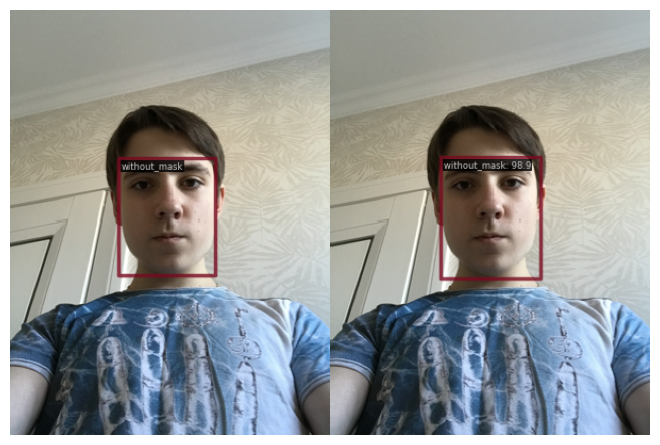

/home/eugene/anaconda3/envs/openmmlab/lib/python3.9/site-packages/mmengine/utils/manager.py:113: UserWarning: <class 'mmdet.visualization.local_visualizer.DetLocalVisualizer'> instance named of visualiser has been created, the method `get_instance` should not accept any other arguments
  warnings.warn(


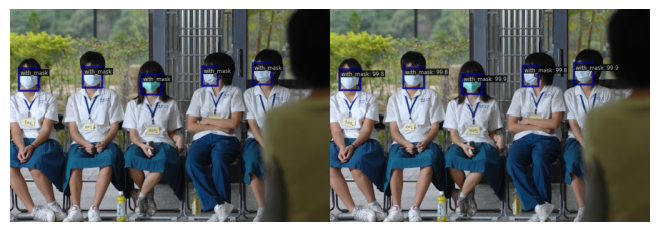

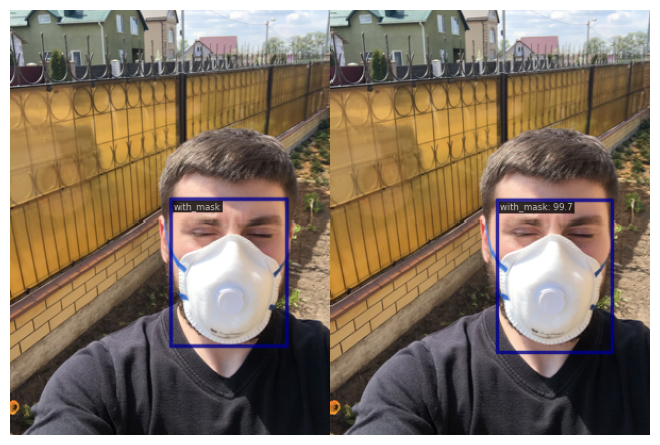

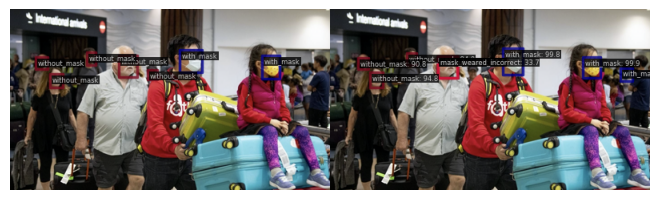

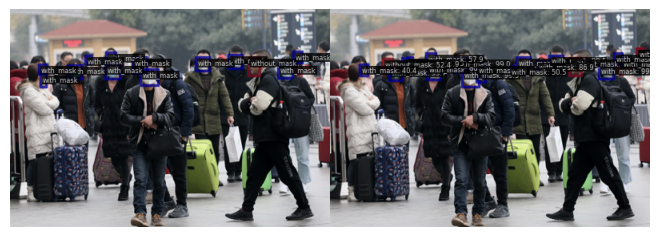

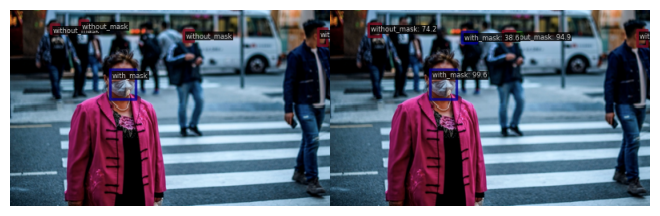

...

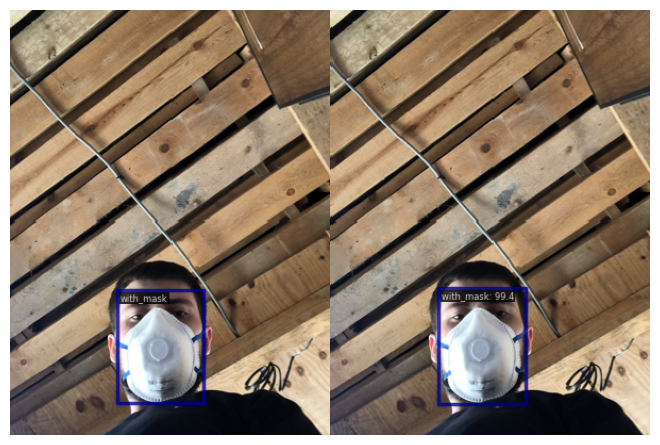

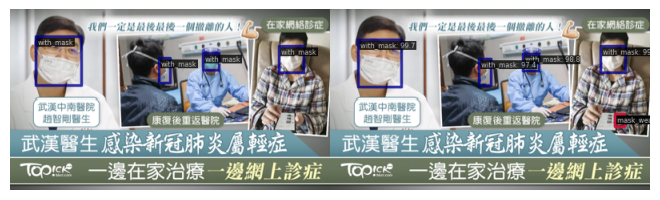

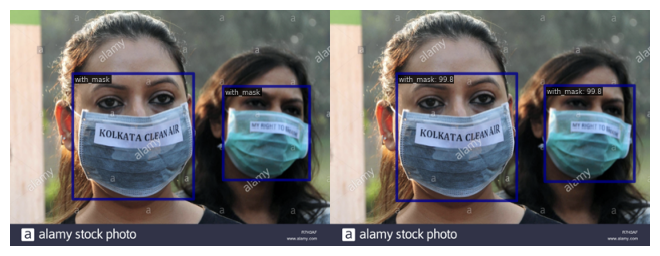

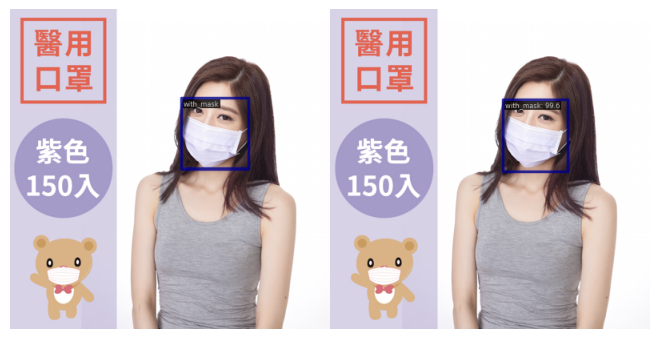

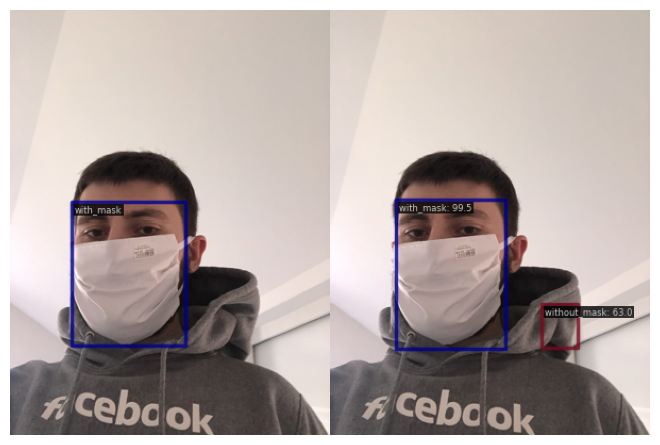

/home/eugene/anaconda3/envs/openmmlab/lib/python3.9/site-packages/mmengine/visualization/visualizer.py:757: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(
/home/eugene/anaconda3/envs/openmmlab/lib/python3.9/site-packages/mmengine/visualization/visualizer.py:828: UserWarning: Warning: The polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(


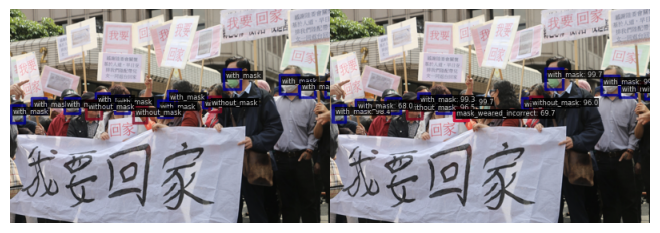

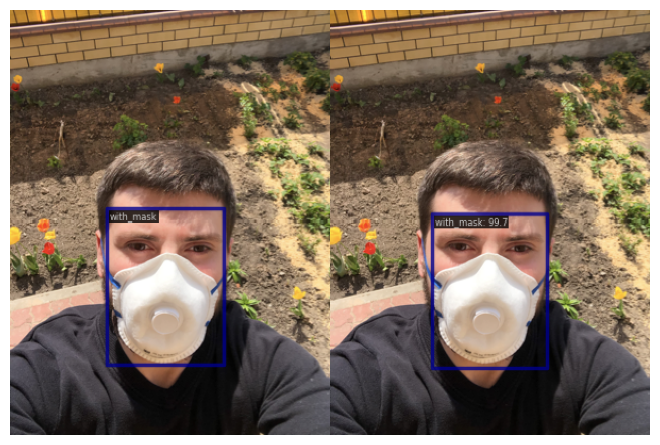

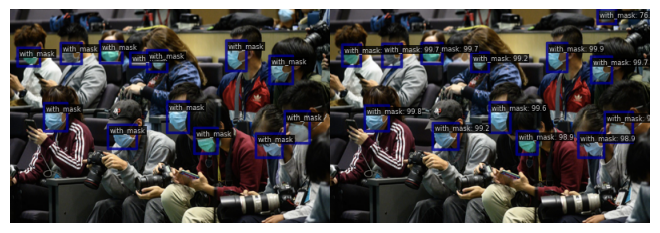

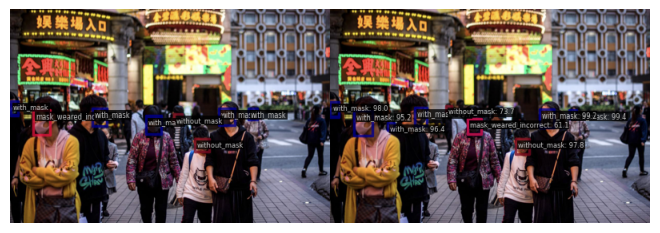

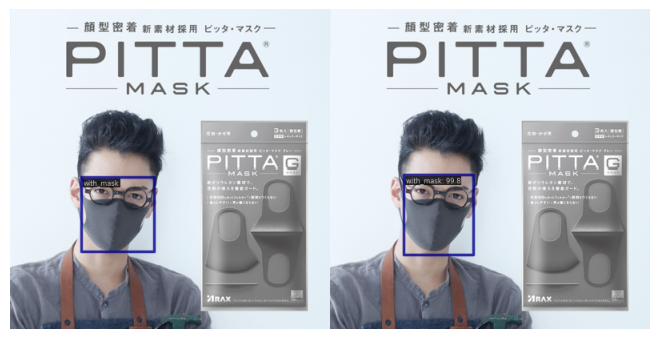

...

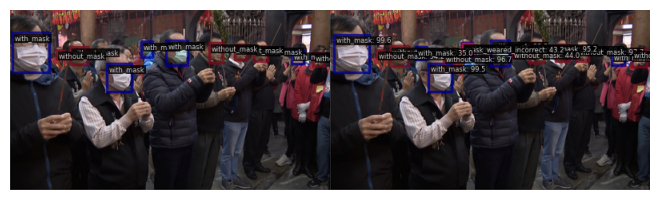

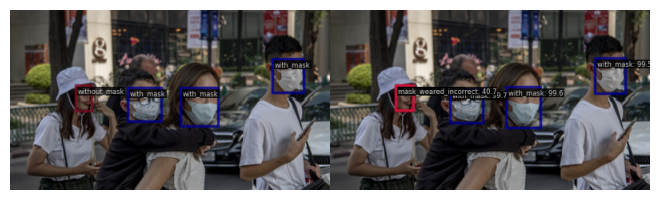

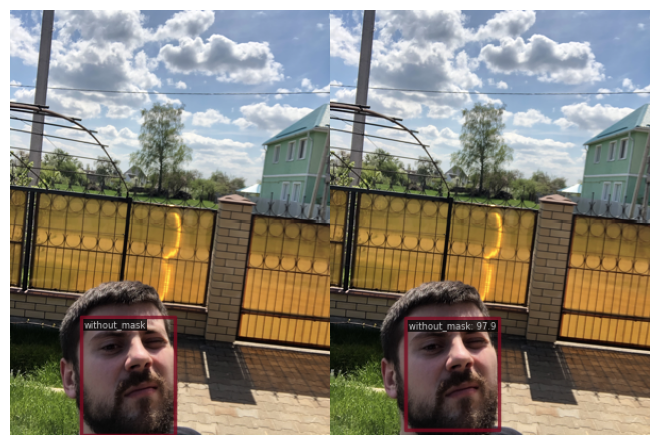

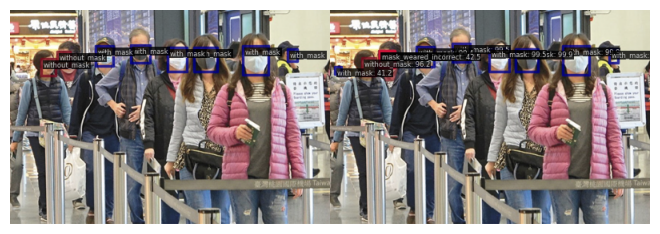

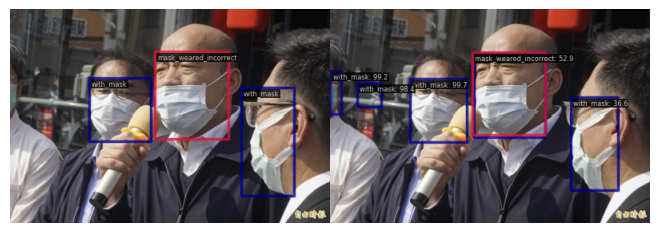

In [9]:
# визуализируем результаты
for i in results[:50]:
    visualizer = VISUALIZERS.build(model.cfg.visualizer)
    visualizer.dataset_meta = model.dataset_meta
    img = mmcv.imread(i.img_path)
    img = mmcv.imconvert(img, 'bgr', 'rgb')
    visualizer.add_datasample(
        i.img_path.split('/')[-1],
        img,
        data_sample=i,
        draw_gt=True,
        draw_pred=True,
        show=True)
    display(visualizer.show())

In [10]:
# Подоготовим данные для метрик
preds = []
targets = []
for r in results:
    res = r.pred_instances.cpu().to_dict()
    res['boxes'] = res['bboxes']
    del res['bboxes']
    preds.append(res)
    for img in data['images']:
        if img['file_name'] == r.img_path.split('/')[-1]:
            labels = []
            bboxes = []
            for a in data['annotations']:
                if a['image_id'] == img['id']:
                    labels.append(a['category_id'])
                    x, y, w, h = a['bbox']
                    bbox = [x, y, x+w, y+h]
                    bboxes.append(bbox)
            ann = {'labels': torch.tensor(labels),
                'boxes': torch.tensor(bboxes)}
            targets.append(ann)

In [11]:
# Посчитаем метрики coco
metric = MeanAveragePrecision()
metric.update(preds, targets)
FasterRCNNmetric = metric.compute()
FasterRCNNmetric

/home/eugene/anaconda3/envs/openmmlab/lib/python3.9/site-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)  # noqa: B028


{'map': tensor(0.5266),
 'map_50': tensor(0.8331),
 'map_75': tensor(0.5978),
 'map_small': tensor(0.4661),
 'map_medium': tensor(0.7106),
 'map_large': tensor(0.8153),
 'mar_1': tensor(0.2847),
 'mar_10': tensor(0.5139),
 'mar_100': tensor(0.6071),
 'mar_small': tensor(0.5529),
 'mar_medium': tensor(0.7587),
 'mar_large': tensor(0.8357),
 'map_per_class': tensor(-1.),
 'mar_100_per_class': tensor(-1.),
 'classes': tensor([0, 1, 2], dtype=torch.int32)}

In [13]:
# Посчитаем метрики coco
metric = MeanAveragePrecision(iou_thresholds=[0.01])
metric.update(preds, targets)
FasterRCNNmetric = metric.compute()
FasterRCNNmetric

{'map': tensor(0.8468),
 'map_50': tensor(-1.),
 'map_75': tensor(-1.),
 'map_small': tensor(0.8023),
 'map_medium': tensor(0.9706),
 'map_large': tensor(0.9997),
 'mar_1': tensor(0.4007),
 'mar_10': tensor(0.7573),
 'mar_100': tensor(0.9124),
 'mar_small': tensor(0.8849),
 'mar_medium': tensor(0.9952),
 'mar_large': tensor(1.),
 'map_per_class': tensor(-1.),
 'mar_100_per_class': tensor(-1.),
 'classes': tensor([0, 1, 2], dtype=torch.int32)}

### При IoU только лишь более 0.01 mAP 0.85